# GUC Clustering Project 

**Objective:** 
The objective of this project teach students how to apply clustering to real data sets

The projects aims to teach student: 
* Which clustering approach to use
* Compare between Kmeans, Hierarchal, DBScan, and Gaussian Mixtures  
* How to tune the parameters of each data approach
* What is the effect of different distance functions (optional) 
* How to evaluate clustering approachs 
* How to display the output
* What is the effect of normalizing the data 

Students in this project will use ready-made functions from Sklearn, plotnine, numpy and pandas 
 



In [ ]:
# if plotnine is not installed in Jupter then use the following command to install it 


Running this project require the following imports 

In [7]:
import warnings
warnings.filterwarnings('ignore')
import seaborn as sns 
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import sklearn.preprocessing as prep
from sklearn.datasets import make_blobs
from plotnine import *   
# StandardScaler is a function to normalize the data 
# You may also check MinMaxScaler and MaxAbsScaler 
#from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import NearestNeighbors

from sklearn.cluster import DBSCAN


from sklearn.cluster import KMeans
from sklearn.mixture import GaussianMixture

from sklearn.metrics import silhouette_score

%matplotlib inline

In [6]:
# helper function that allows us to display data in 2 dimensions an highlights the clusters
def display_cluster(X,km=[],num_clusters=0):
    color = 'brgcmyk'  #List colors
    alpha = 0.5  #color obaque
    s = 20
    if num_clusters == 0:
        plt.scatter(X[:,0],X[:,1],c = color[0],alpha = alpha,s = s)
    else:
        for i in range(num_clusters):
            plt.scatter(X[km.labels_==i,0],X[km.labels_==i,1],c = color[i],alpha = alpha,s=s)
            plt.scatter(km.cluster_centers_[i][0],km.cluster_centers_[i][1],c = color[i], marker = 'x', s = 100)

## Multi Blob Data Set 
* The Data Set generated below has 6 cluster with varying number of users and varing densities
* Cluster the data set below using 



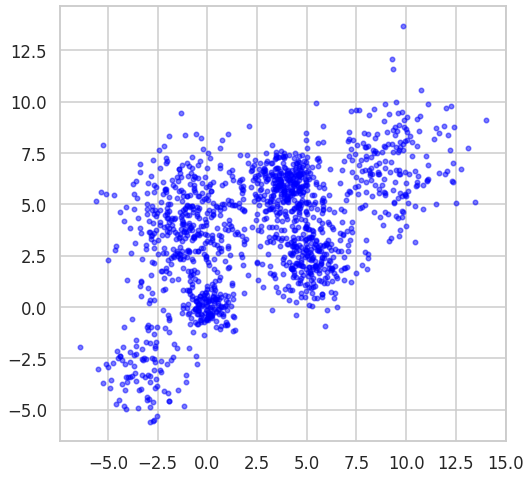

In [9]:
plt.rcParams['figure.figsize'] = [8,8]
sns.set_style("whitegrid")
sns.set_context("talk")

n_bins = 6  
centers = [(-3, -3), (0, 0), (5,2.5),(-1, 4), (4, 6), (9,7)]
Multi_blob_Data, y = make_blobs(n_samples=[100,150, 300, 400,300, 200], n_features=2, cluster_std=[1.3,0.6, 1.2, 1.7,0.9,1.7],
                  centers=centers, shuffle=False, random_state=42)
display_cluster(Multi_blob_Data)

### Kmeans 
* Use Kmeans with different values of K to cluster the above data 
* Display the outcome of each value of K 
* Plot distortion function versus K and choose the approriate value of k 
* Plot the silhouette_score versus K and use it to choose the best K 
* Store the silhouette_score for the best K for later comparison with other clustering techniques. 

In [3]:
def k_means(dataset):
    dist_k = np.array([])
    silo_k = np.array([])

    for i in range(1, 8):

        k_means = KMeans(init="k-means++", n_clusters=i, n_init=12)
        k_means.fit(dataset)
        k_means_labels = k_means.labels_
        k_means_cluster_centers = k_means.cluster_centers_
        dist_k = np.append(dist_k, k_means.inertia_)
        if i > 1:
            silo_k = np.append(silo_k, silhouette_score(dataset, k_means_labels))
        fig = plt.figure(figsize=(6, 4))
        ax = fig.add_subplot(1, 1, 1)
        colors = plt.cm.Spectral(np.linspace(0, 1, len(set(k_means_labels))))
        for k, col in zip(range(len(k_means_cluster_centers)), colors):
            my_members = (k_means_labels == k)
            cluster_center = k_means_cluster_centers[k]
            ax.plot(dataset[my_members, 0], dataset[my_members, 1], 'w', markerfacecolor=col, marker='.')
            ax.plot(cluster_center[0], cluster_center[1], 'o', markerfacecolor=col, markeredgecolor='k', markersize=6)
        ax.set_title('KMeans')
        ax.set_xticks(())
        ax.set_yticks(())
        plt.show()
    ###########################################################################################################################################################################################
    #The Distortion function

    fig, ax = plt.subplots(1, 2, figsize=(12, 4))

    K = np.arange(1, 8)
    ax[0].plot(K, dist_k)
    ax[0].set_title('Distortion Function')
    ax[0].set_xlabel('K')
    ax[0].set_ylabel('Distortion')
    ax[1].plot(K[1:], silo_k)
    ax[1].set_title('Silhouette Score')
    ax[1].set_xlabel('K')
    ax[1].set_ylabel('Score')
    best_silo = silo_k[np.argmax(silo_k)]
    print(f'Best Silhouette Score: {best_silo:.3f}')

    plt.show()


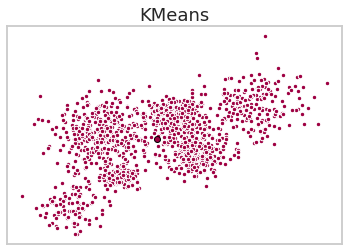

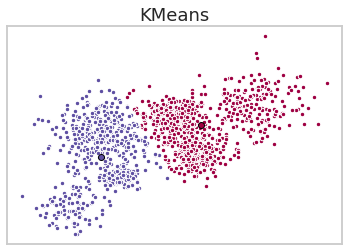

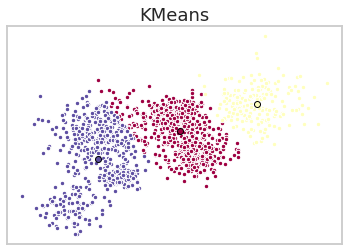

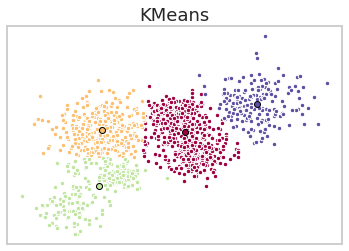

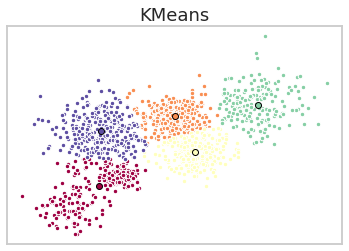

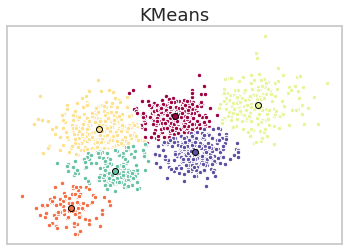

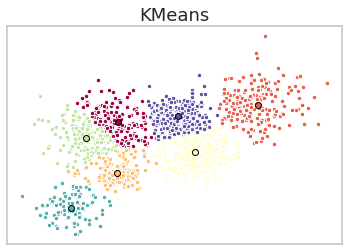

Best Silhouette Score: 0.486


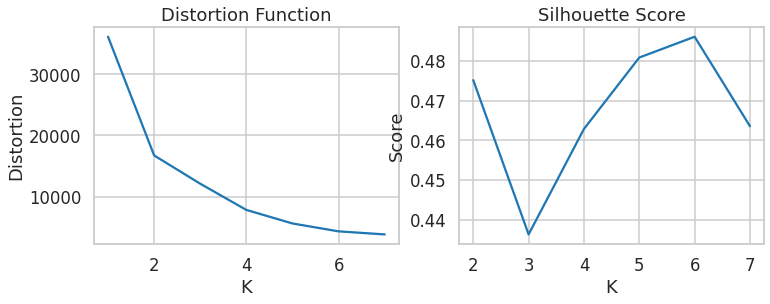

In [10]:
k_means(Multi_blob_Data)

### Hierarchal Clustering
* Use AgglomerativeClustering function to  to cluster the above data 
* In the  AgglomerativeClustering change the following parameters 
    * Affinity (use euclidean, manhattan and cosine)
    * Linkage( use average and single )
    * Distance_threshold (try different)
* For each of these trials plot the Dendograph , calculate the silhouette_score and display the resulting clusters  
* Find the set of paramters that would find result in the best silhouette_score and store this score for later comparison with other clustering techniques. 
* Record your observation 

In [15]:
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import silhouette_score    
import numpy as np
import matplotlib.pyplot as plt
from scipy.cluster.hierarchy import dendrogram, linkage
def display_cluster_agglomerative(data, model, n_clusters):
    plt.figure(figsize=(10, 5))
    plt.scatter(data[:, 0], data[:, 1], c=model.labels_, cmap='rainbow')
    plt.title(f"Agglomerative Clustering (n_clusters={n_clusters})")
def Hierarchal_Clustering(dataset, distances):
    aff = ['euclidean', 'manhattan', 'cosine']
    link = ['ward', 'average', 'single']
    dist = distances

    sil_agglomerative_aff = []
    agglomerative_aff = []

    for i in aff:
        agglomerative = AgglomerativeClustering(n_clusters=7, affinity=i, linkage='average')
        agglomerative.fit(dataset)
        labels = agglomerative.labels_
        no_clusters = len(np.unique(agglomerative.labels_))-1
        if no_clusters > 1:
            agglomerative_aff.append(i)
            sil_agglomerative_aff.append(silhouette_score(dataset, agglomerative.labels_))

        display_cluster_agglomerative(dataset, agglomerative, 7)
        Z = linkage(dataset, method='average')
        plt.figure(figsize=(10, 5))
        dendrogram(Z)
        plt.show()

    sil_agglomerative_link = []
    agglomerative_link = []

    for j in link:
        agglomerative = AgglomerativeClustering(n_clusters=7, affinity='euclidean', linkage=j)
        agglomerative.fit(dataset)
        labels = agglomerative.labels_
        no_clusters = len(np.unique(agglomerative.labels_))-1
        if no_clusters > 1:
            agglomerative_link.append(j)
            sil_agglomerative_link.append(silhouette_score(dataset, agglomerative.labels_))
        
        display_cluster_agglomerative(dataset, agglomerative, 7)
        Z = linkage(dataset, method=j)
        plt.figure(figsize=(10, 5))
        dendrogram(Z)
        plt.show()

    sil_agglomerative_dist = []
    agglomerative_dist = []

    for k in dist:
        agglomerative = AgglomerativeClustering(n_clusters=None, affinity='euclidean', linkage='ward', distance_threshold=k)
        agglomerative.fit(dataset)
        labels = agglomerative.labels_
        no_clusters = len(np.unique(agglomerative.labels_))-1
        if no_clusters > 1:
            agglomerative_dist.append(k)
            sil_agglomerative_dist.append(silhouette_score(dataset, agglomerative.labels_))
        
        display_cluster_agglomerative(dataset, agglomerative, 7)
        Z = linkage(dataset, method='ward')
        plt.figure(figsize=(10, 5))
        dendrogram(Z)
        plt.show()
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 5))
    ax1.plot(agglomerative_aff,sil_agglomerative_aff)
    ax2.plot(agglomerative_link,sil_agglomerative_link)

    ax1.set_xlabel('Affinity')
    ax1.set_ylabel('Silhouette score')
    ax2.set_xlabel('Linkage')
    ax2.set_ylabel('Silhouette score')
    plt.show()
    fig,ax3=plt.subplots(1,figsize=(10,5))
    ax3.plot(agglomerative_dist,sil_agglomerative_dist)
    ax3.set_xlabel('Distance threshold')
    ax3.set_ylabel('Silhouette score')
    plt.show()

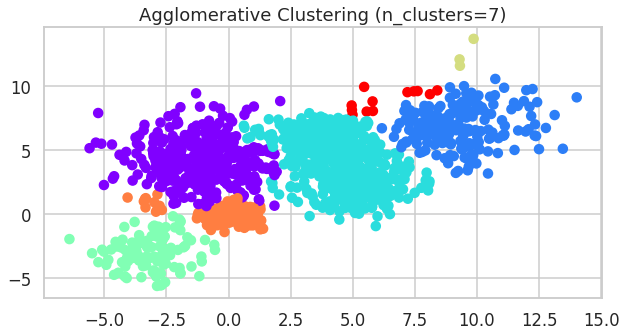

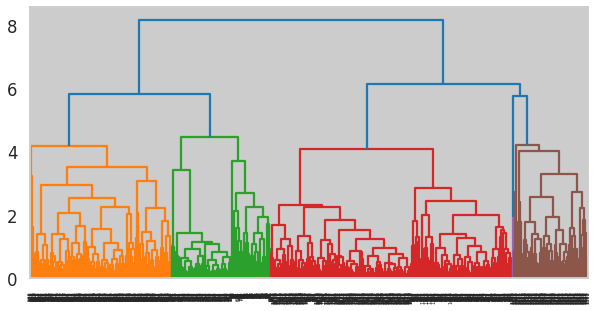

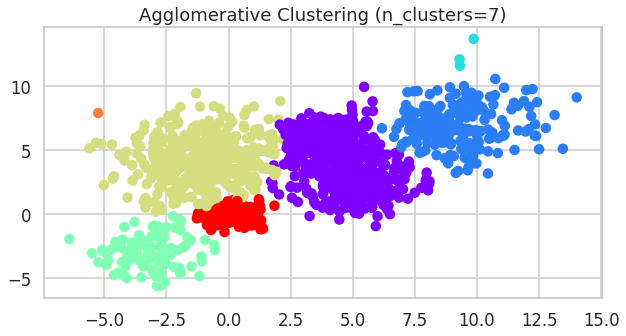

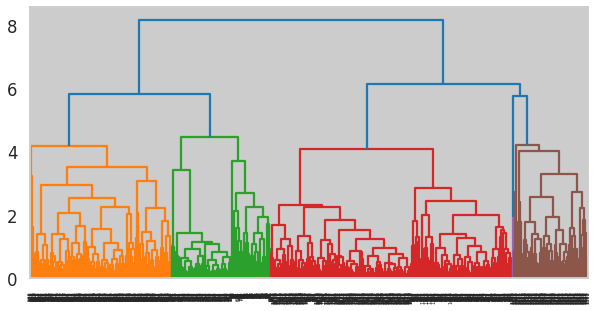

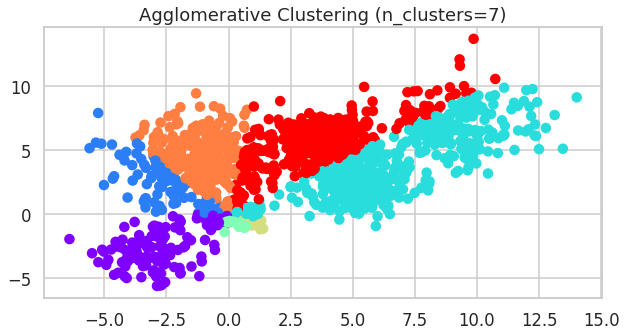

...

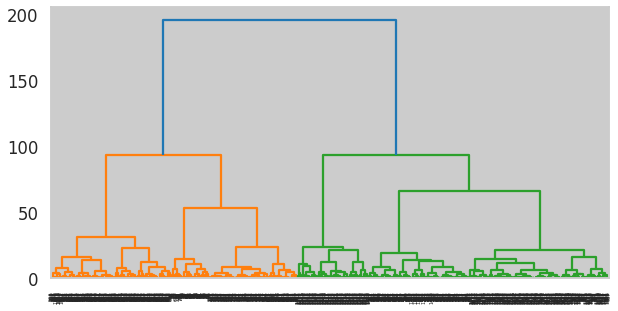

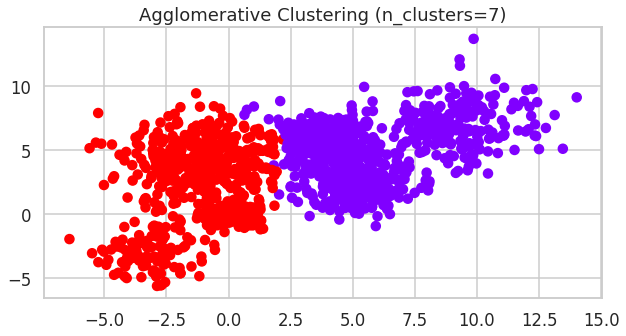

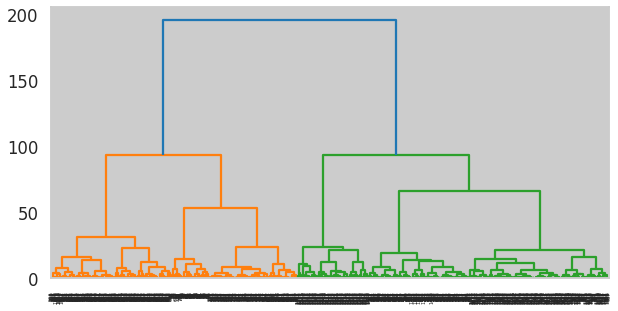

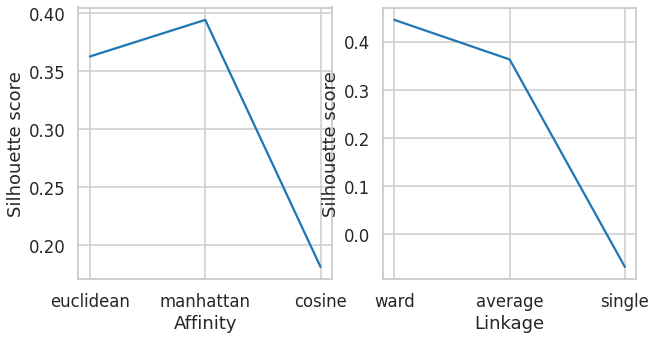

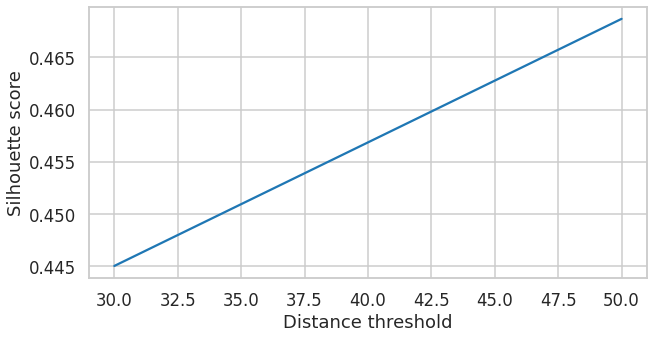

In [16]:
Hierarchal_Clustering(Multi_blob_Data,[30,50,100])

### DBScan
* Use DBScan function to  to cluster the above data 
* In the  DBscan change the following parameters 
    * EPS (from 0.1 to 3)
    * Min_samples (from 5 to 25)
* Plot the silhouette_score versus the variation in the EPS and the min_samples
* Plot the resulting Clusters in this case 
* Find the set of paramters that would find result in the best silhouette_score and store this score for later comparison with other clustering techniques. 
* Record your observations and comments 

In [17]:
def DB_Scanning(dataset):
    silhouette_eps = []
    eps_values = []
    silhouette_min_samples = []
    min_samples_values = []

    for eps in range(1, 30):
        eps_value = eps * 0.1
        dbscan_model = DBSCAN(eps=eps_value, min_samples=15, metric='euclidean')
        dbscan_model.fit(dataset)
        labels = dbscan_model.labels_
        n_clusters = len(np.unique(labels)) - 1
        print(f"Total number of clusters: {n_clusters}")

        if n_clusters > 1:
            eps_values.append(eps_value)
            silhouette_score_eps = silhouette_score(dataset, labels)
            silhouette_eps.append(silhouette_score_eps)

        plt.scatter(dataset[:, 0], dataset[:, 1], c=labels, cmap='tab10', vmin=-1, vmax=9)
        plt.scatter(dataset[labels == -1, 0], dataset[labels == -1, 1], c='k', alpha=0.5)
        plt.xlabel('Feature 1')
        plt.ylabel('Feature 2')
        plt.title('DBSCAN Clustering')
        plt.show()

    for min_samples in range(5, 25):

        dbscan_model = DBSCAN(eps=1, min_samples=min_samples, metric='euclidean')
        dbscan_model.fit(dataset)
        labels = dbscan_model.labels_
        n_clusters = len(np.unique(labels)) - 1
        print(f"Total number of clusters: {n_clusters}")

        if n_clusters > 1:
            min_samples_values.append(min_samples)
            silhouette_score_min_samples = silhouette_score(dataset, labels)
            silhouette_min_samples.append(silhouette_score_min_samples)

        plt.scatter(dataset[:, 0], dataset[:, 1], c=labels, cmap='tab10', vmin=-1, vmax=9)
        plt.scatter(dataset[labels == -1, 0], dataset[labels == -1, 1], c='k', alpha=0.5)
        plt.xlabel('Feature 1')
        plt.ylabel('Feature 2')
        plt.title('DBSCAN Clustering')
        plt.show()

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 5))
    ax1.plot(eps_values, silhouette_eps)
    ax1.set_xlabel('EPS')
    ax1.set_ylabel('Silhouette score')
    ax2.plot(min_samples_values, silhouette_min_samples)
    ax2.set_xlabel('Min number of Samples')
    ax2.set_ylabel('Silhouette score')



Total number of clusters: 0


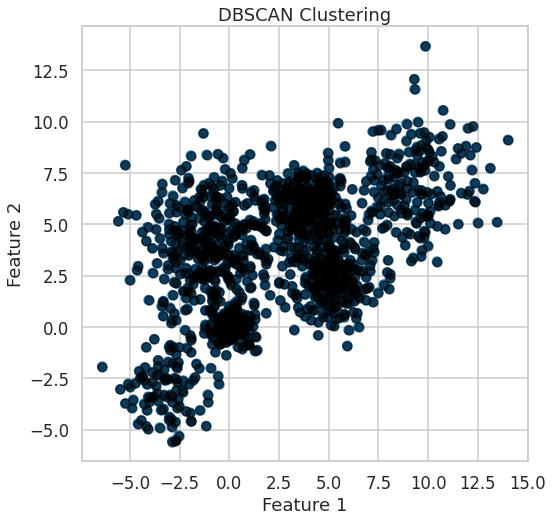

Total number of clusters: 1


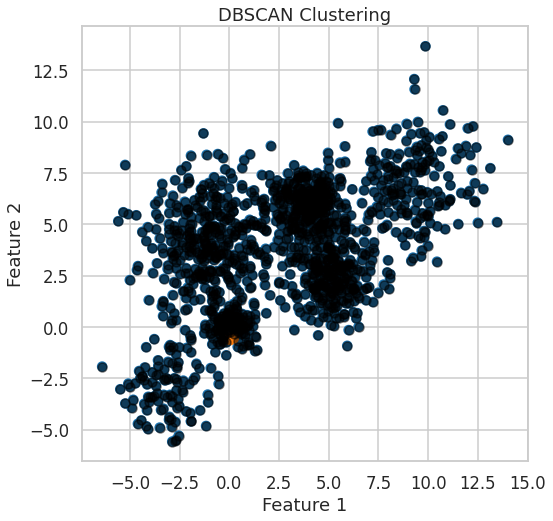

Total number of clusters: 2


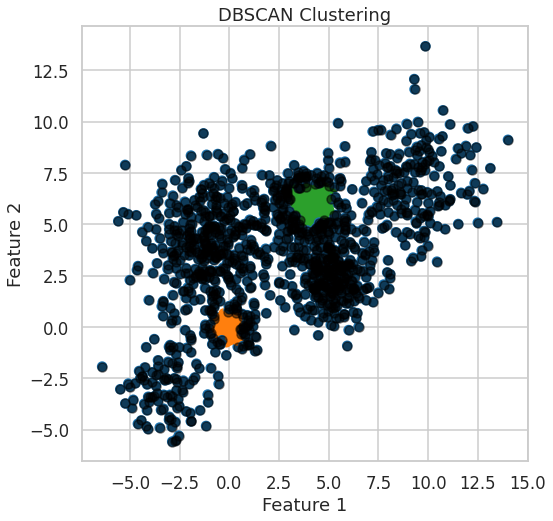

Total number of clusters: 6


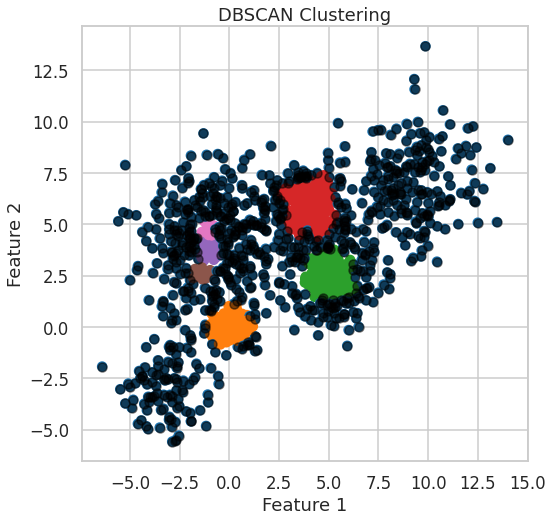

Total number of clusters: 4


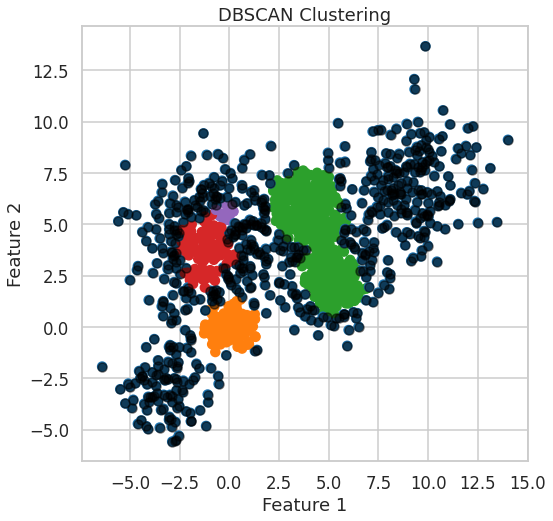

Total number of clusters: 5


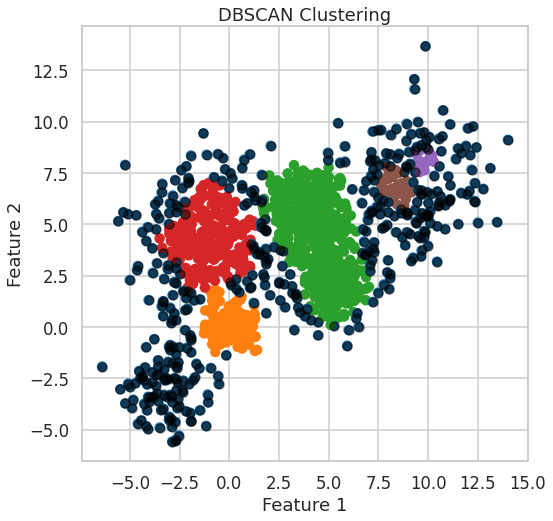

Total number of clusters: 4


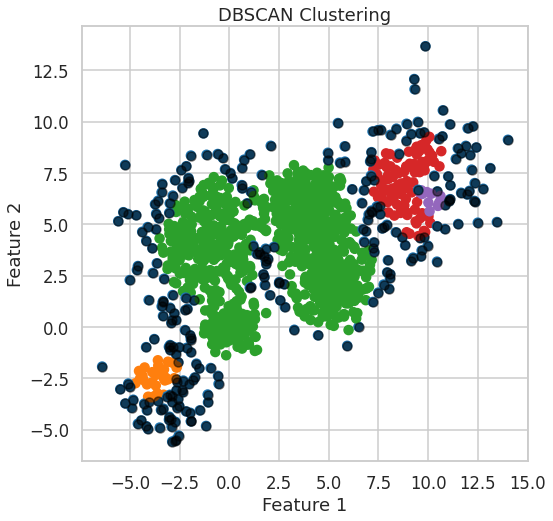

Total number of clusters: 3


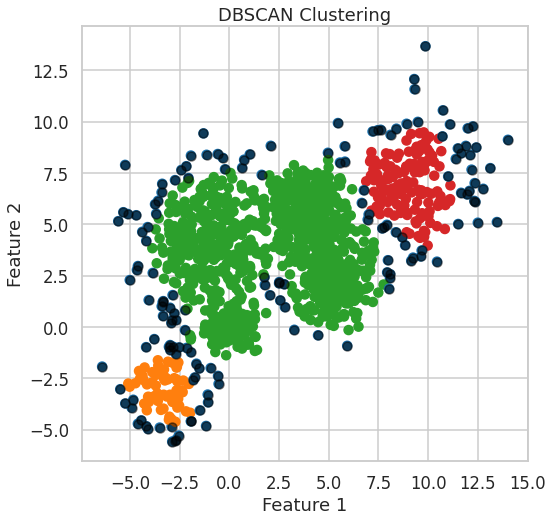

Total number of clusters: 3


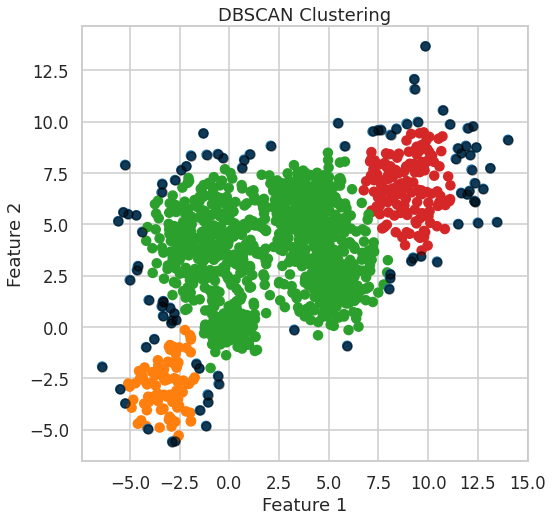

Total number of clusters: 2


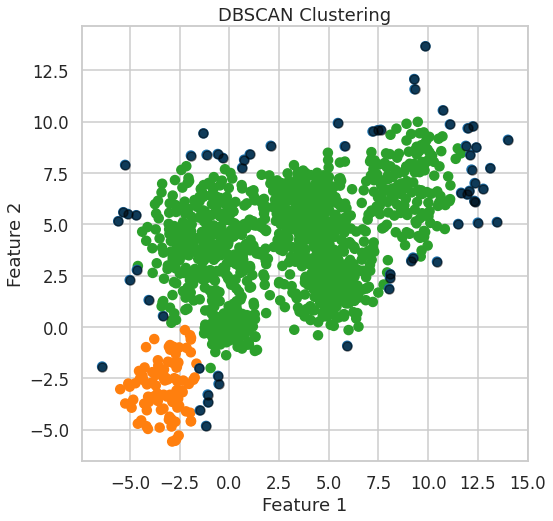

Total number of clusters: 1


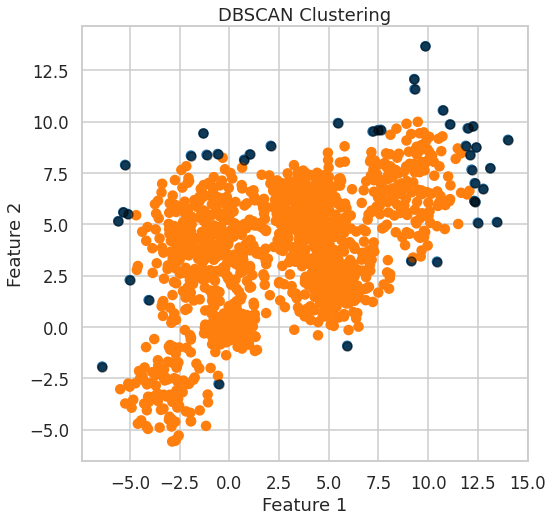

Total number of clusters: 1


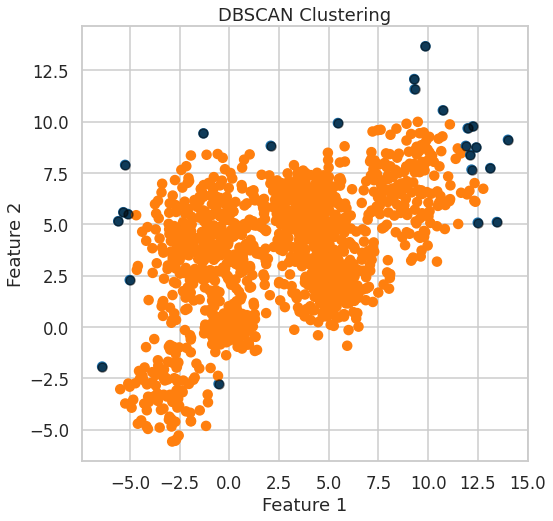

Total number of clusters: 1


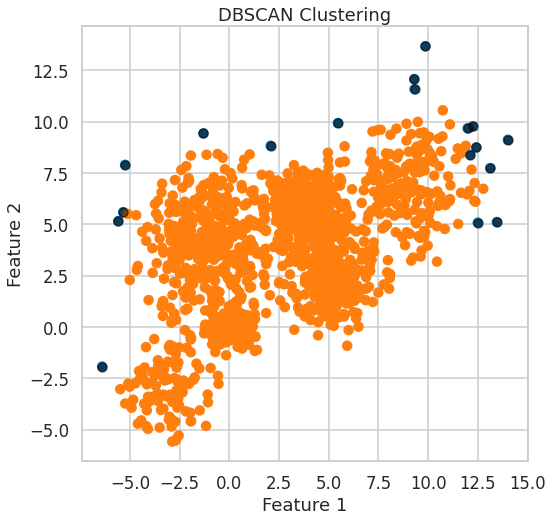

Total number of clusters: 1


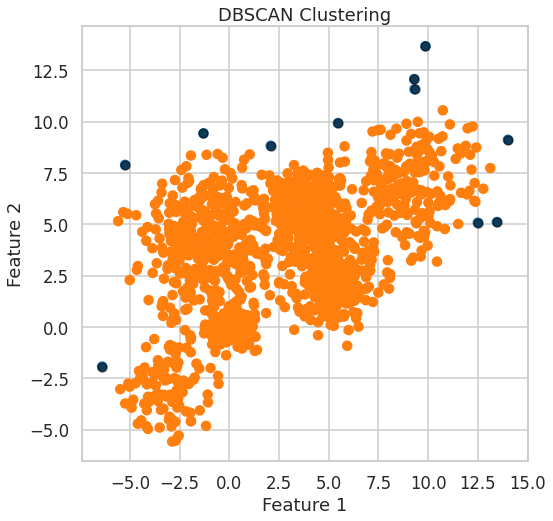

Total number of clusters: 1


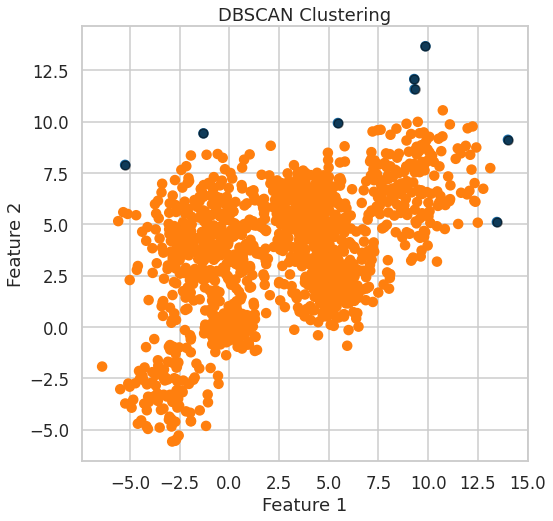

Total number of clusters: 1


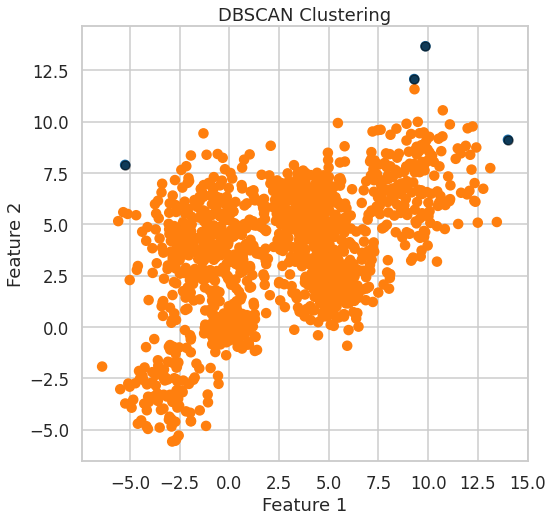

Total number of clusters: 1


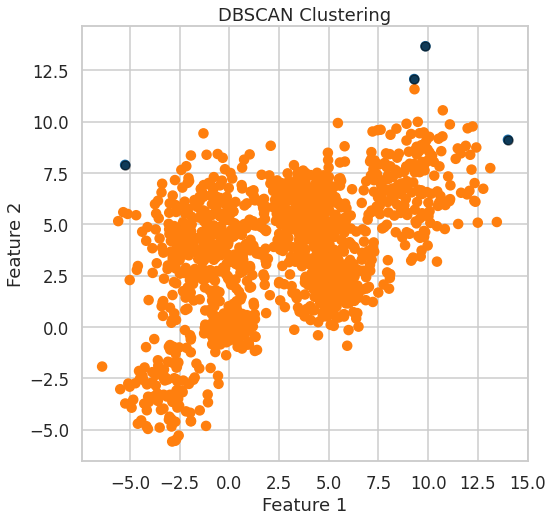

Total number of clusters: 1


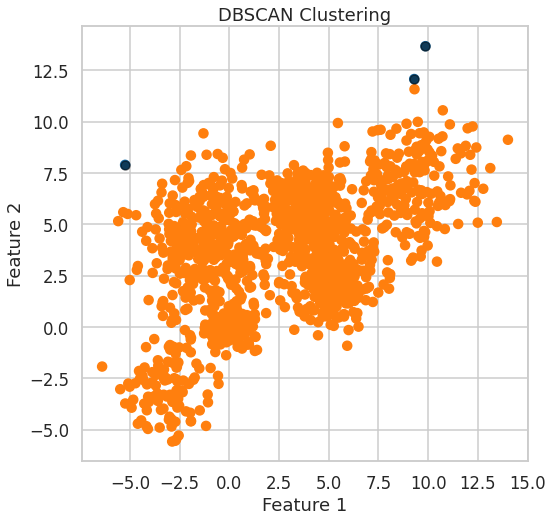

Total number of clusters: 1


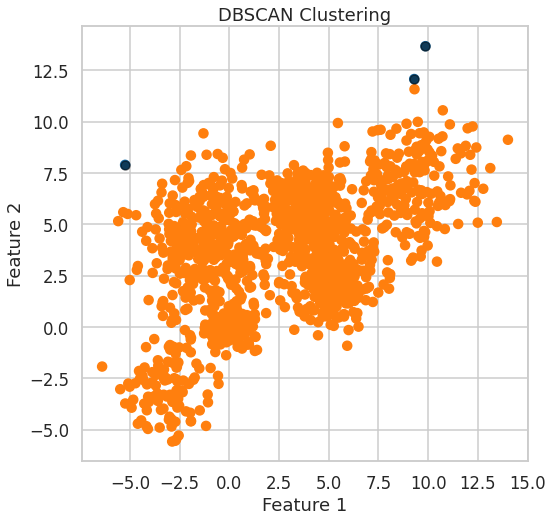

Total number of clusters: 1


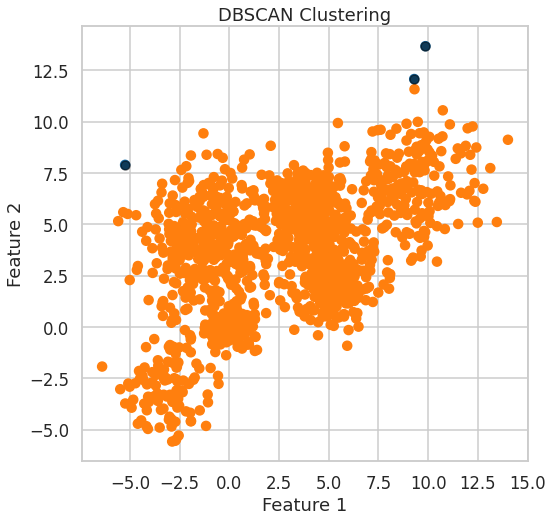

Total number of clusters: 1


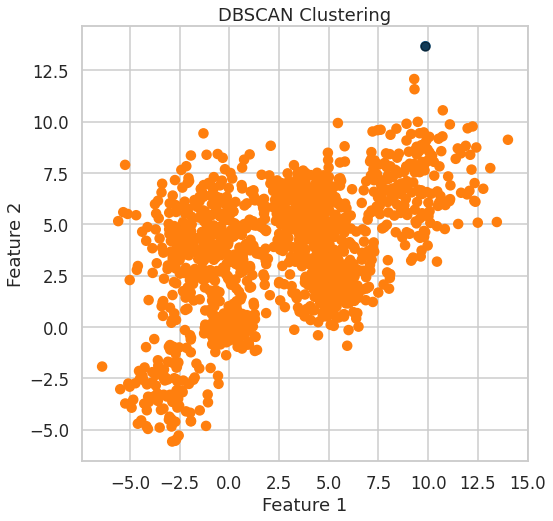

Total number of clusters: 1


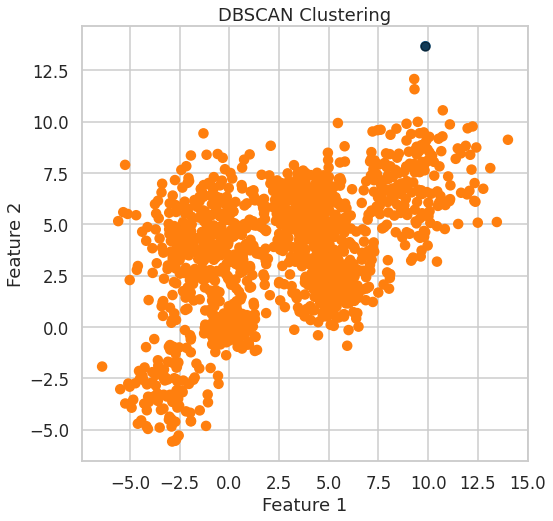

Total number of clusters: 1


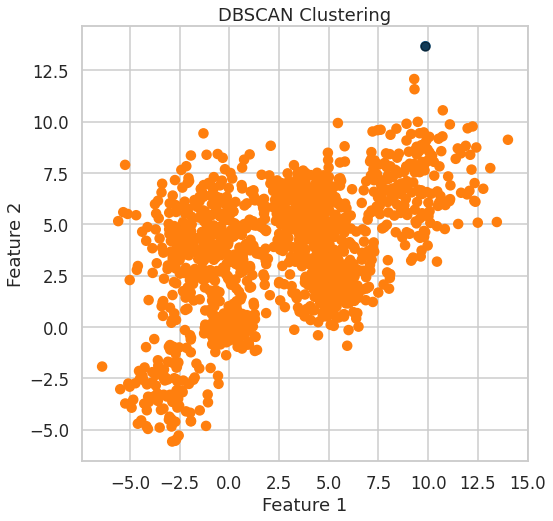

Total number of clusters: 1


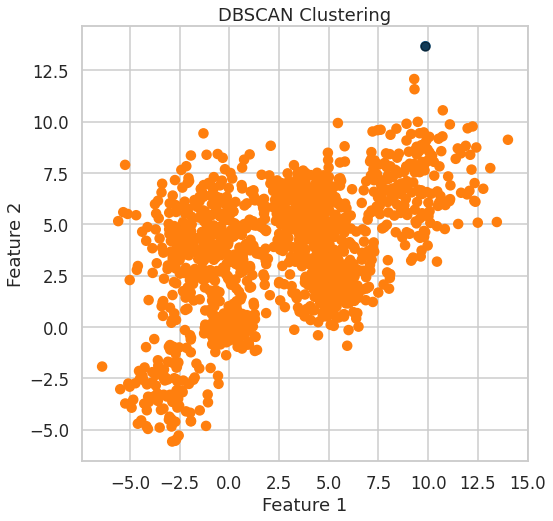

Total number of clusters: 1


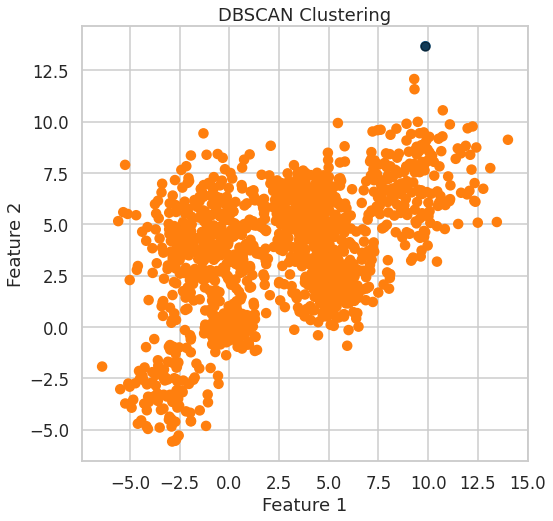

Total number of clusters: 0


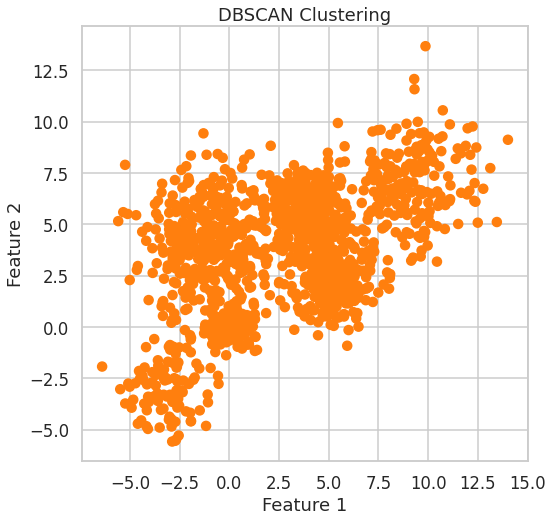

Total number of clusters: 0


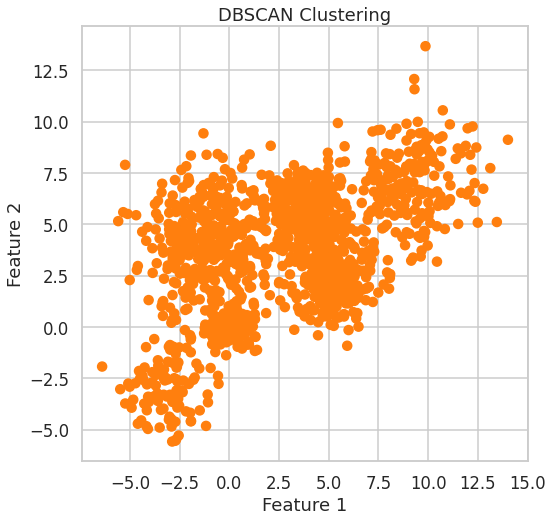

Total number of clusters: 0


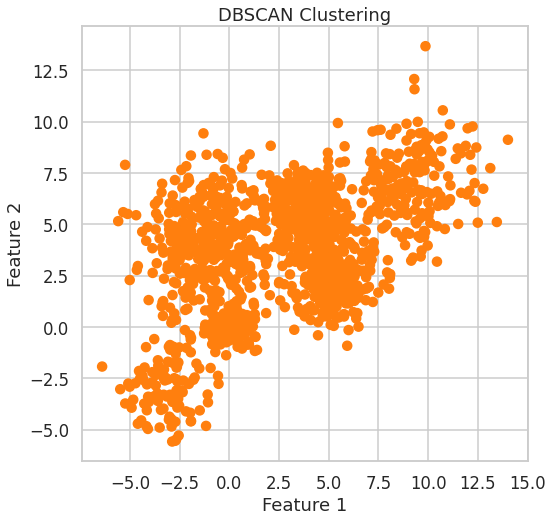

Total number of clusters: 0


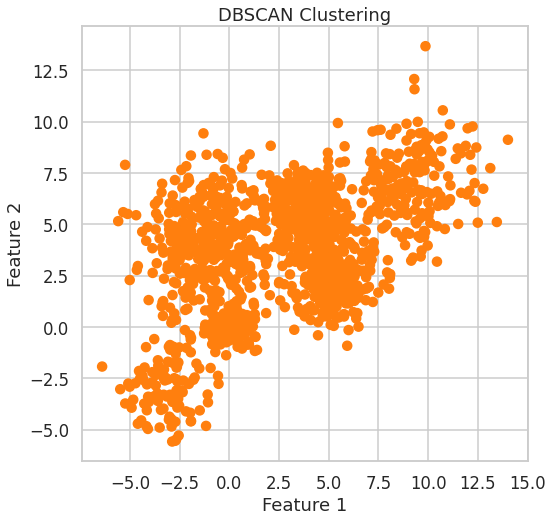

Total number of clusters: 1


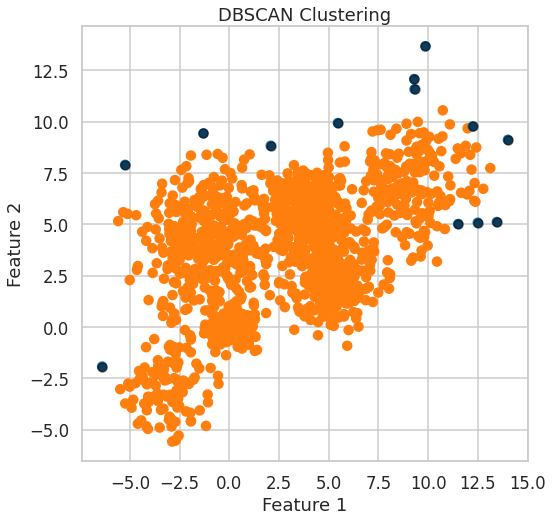

Total number of clusters: 1


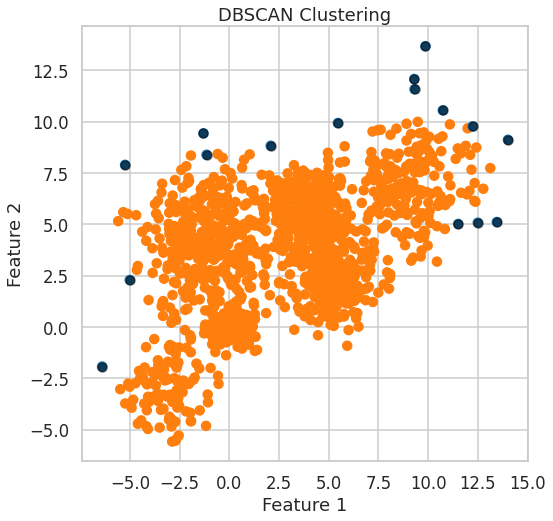

Total number of clusters: 1


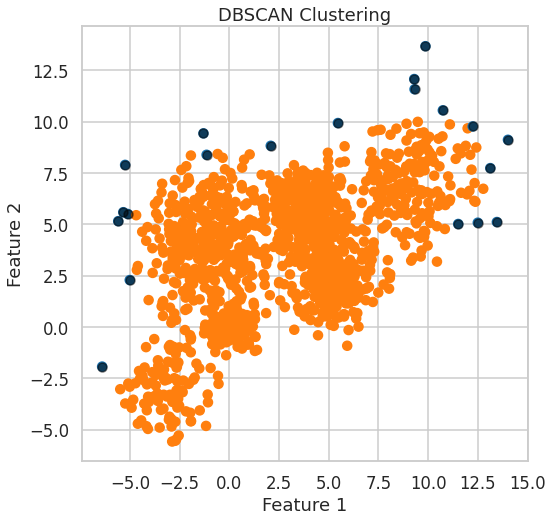

Total number of clusters: 1


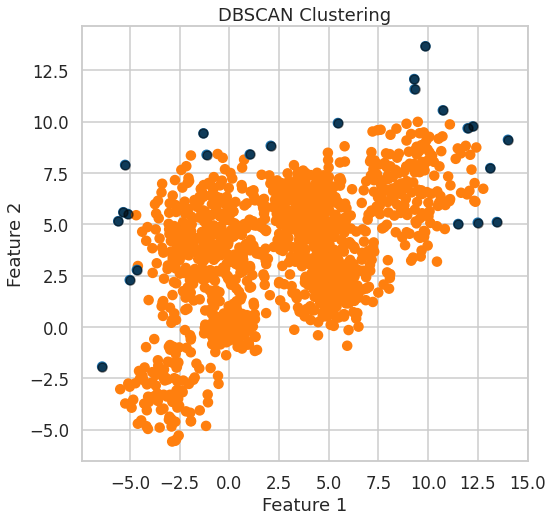

Total number of clusters: 1


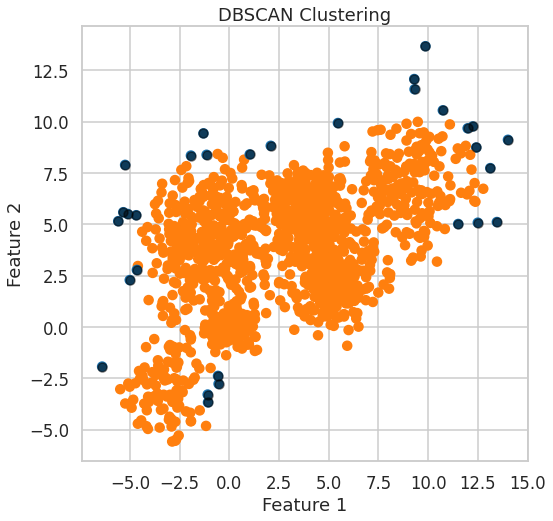

Total number of clusters: 1


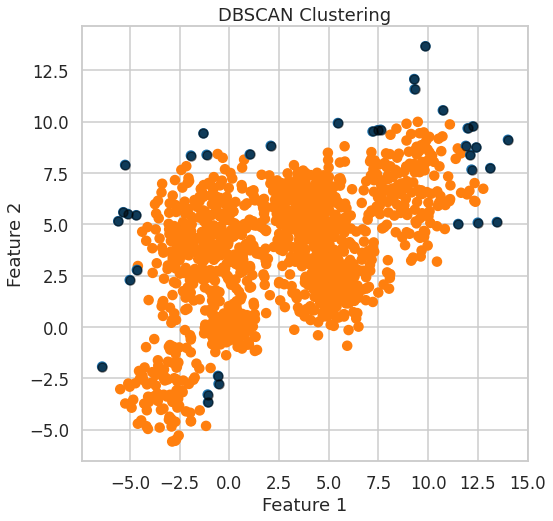

Total number of clusters: 1


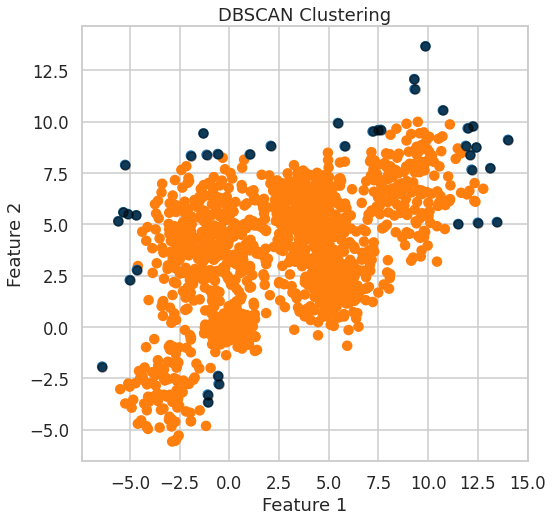

Total number of clusters: 1


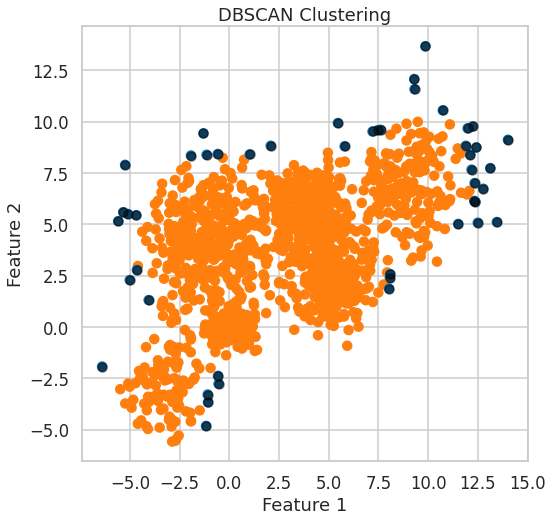

Total number of clusters: 2


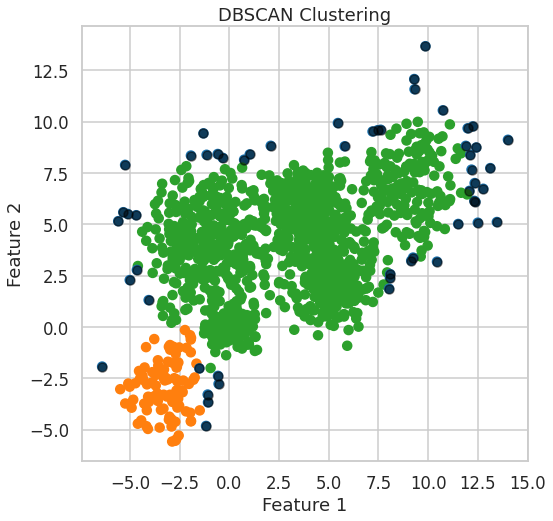

Total number of clusters: 2


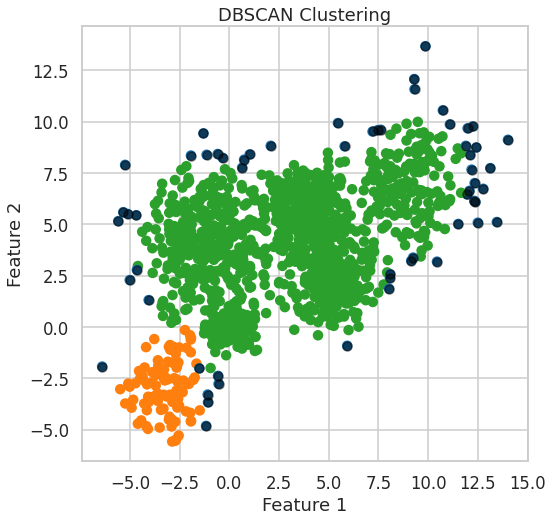

Total number of clusters: 2


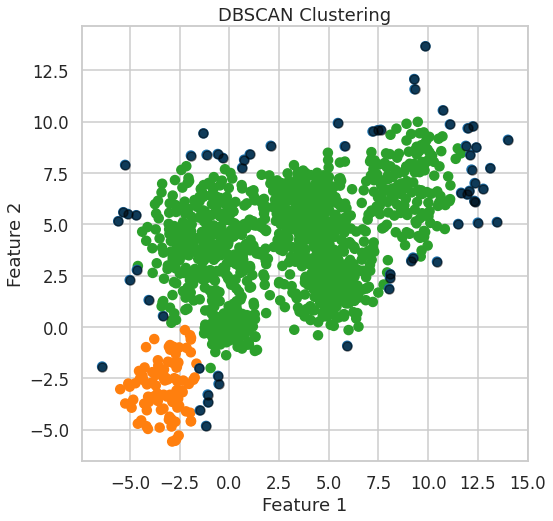

Total number of clusters: 2


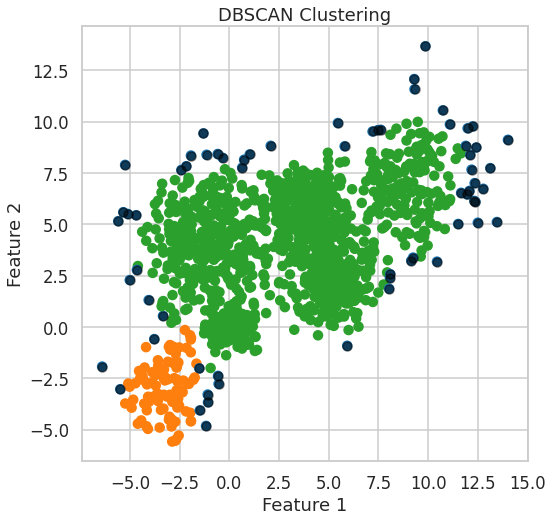

Total number of clusters: 2


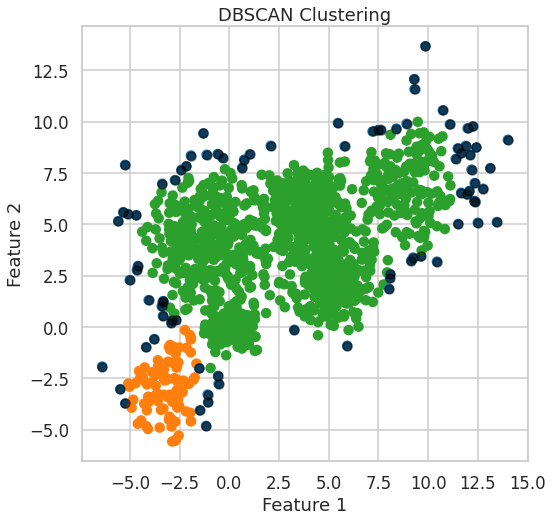

Total number of clusters: 2


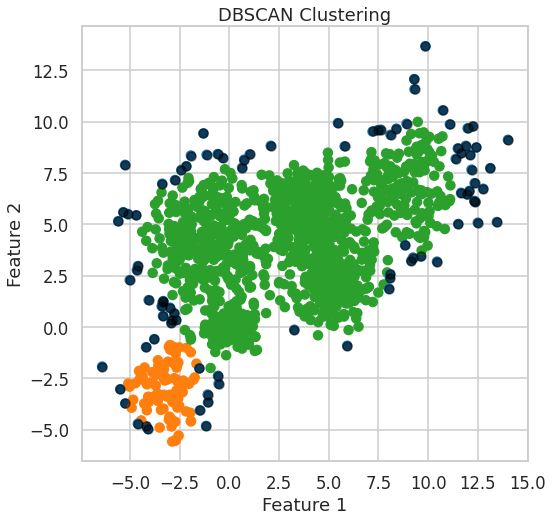

Total number of clusters: 3


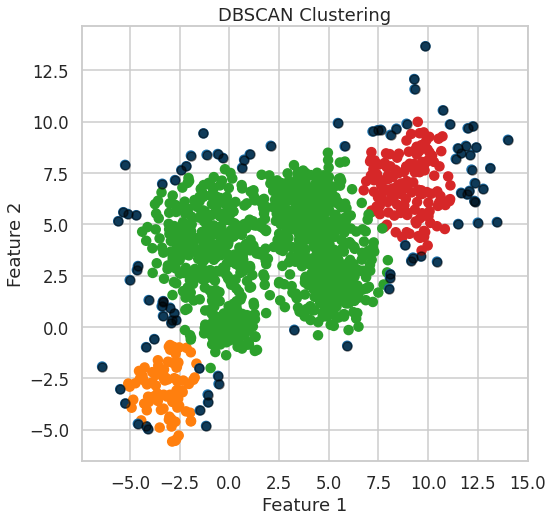

Total number of clusters: 3


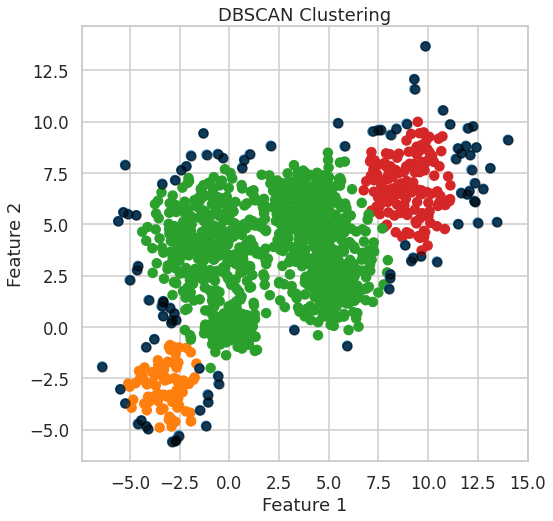

Total number of clusters: 3


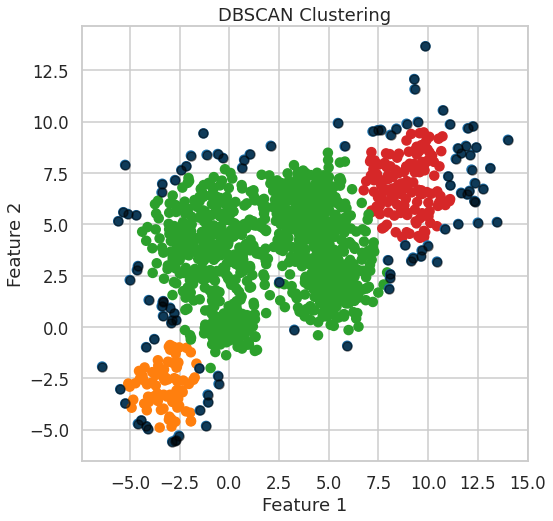

Total number of clusters: 3


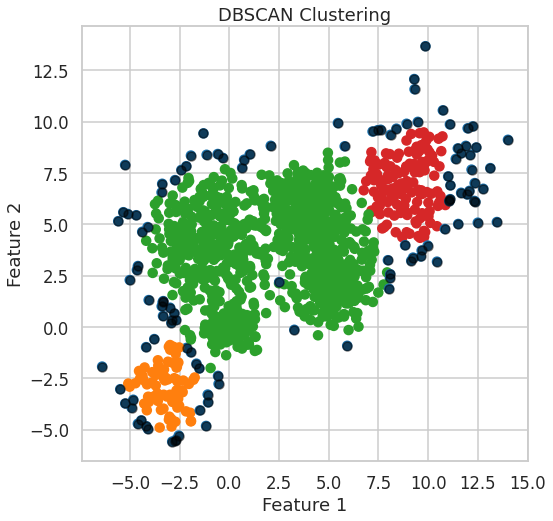

Total number of clusters: 3


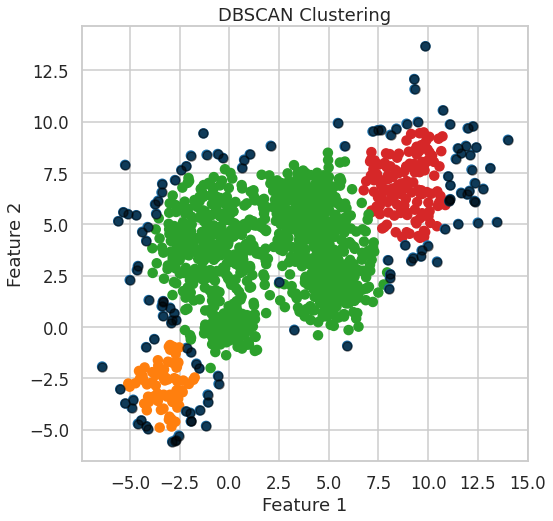

Total number of clusters: 3


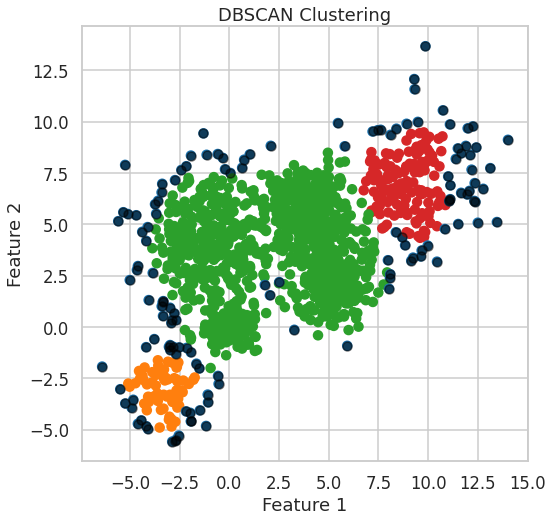

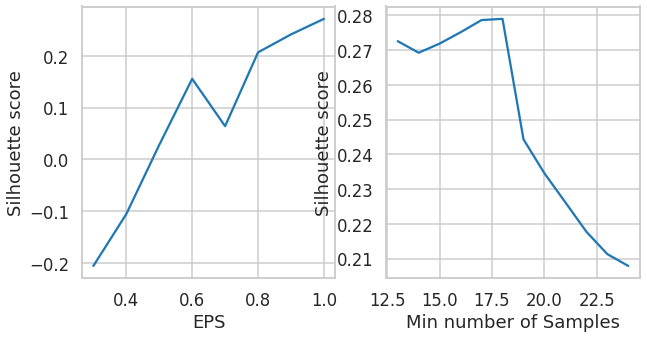

In [18]:
DB_Scanning(Multi_blob_Data)

### Gaussian Mixture
* Use GaussianMixture function to cluster the above data 
* In GMM change the covariance_type and check the difference in the resulting proabability fit 
* Use a 2D contour plot to plot the resulting distribution (the components of the GMM) as well as the total Gaussian mixture 

In [39]:
from sklearn.mixture import GaussianMixture

def TheGaussian(dataset):   
    cov_types = ['full', 'tied', 'diag', 'spherical']
    silhouette_scores = {}
    for cov_type in cov_types:
        gm = GaussianMixture(n_components=4, covariance_type=cov_type, random_state=0)
        gm.fit(dataset)
        labels = gm.predict(dataset)
        n_clusters = len(np.unique(labels)) - 1
        if n_clusters > 1:
            silhouette_scores[cov_type] = silhouette_score(dataset, labels)
            plt.scatter(dataset[:, 0], dataset[:, 1], c=labels, cmap='viridis')
            plt.show()

    n_clusters = range(2, 12)
    silhouette_scores_n = []
    for n in n_clusters:
        gm = GaussianMixture(n_components=n, covariance_type='full', random_state=0)
        gm.fit(dataset)
        labels = gm.predict(dataset)
        n_clusters = len(np.unique(labels)) - 1
        if n_clusters > 1:
            silhouette_scores_n.append(silhouette_score(dataset, labels))
            plt.scatter(dataset[:, 0], dataset[:, 1], c=labels, cmap='viridis')
            plt.show()


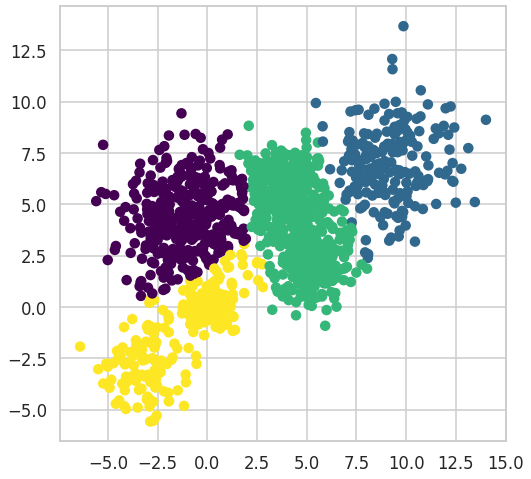

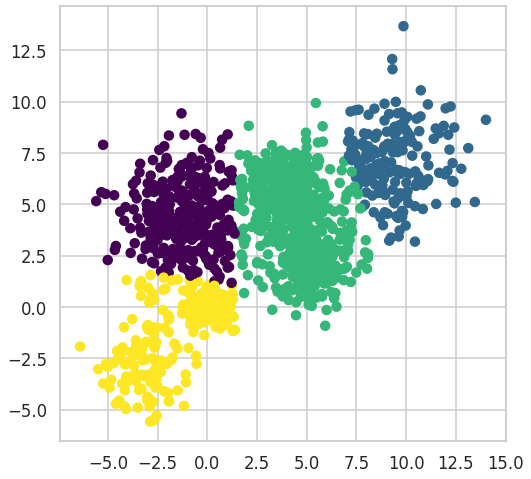

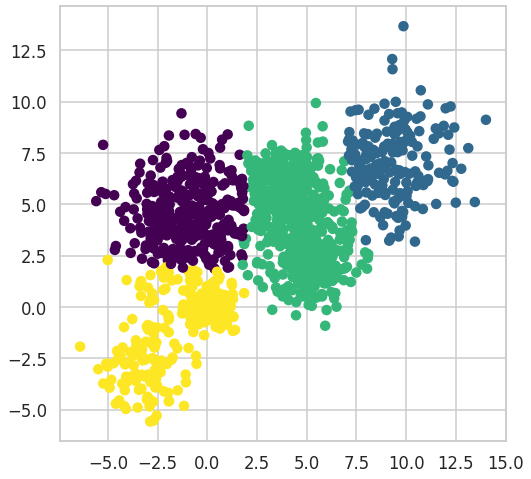

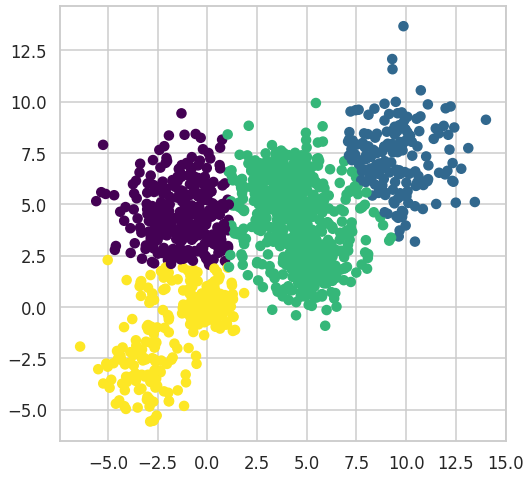

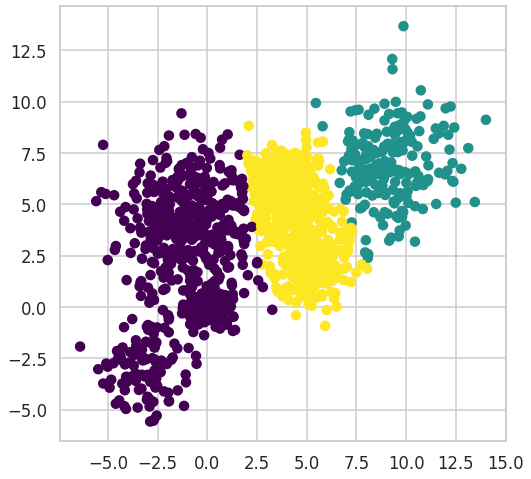

...

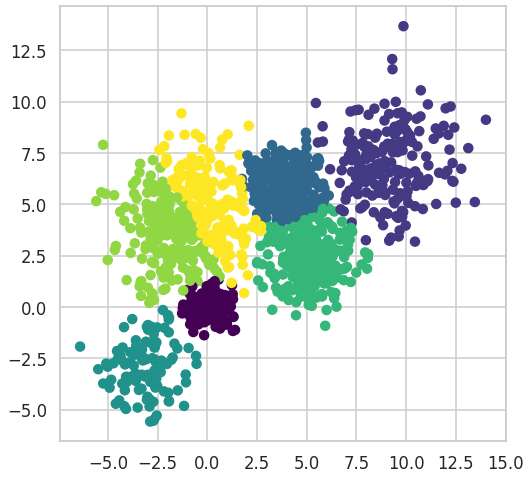

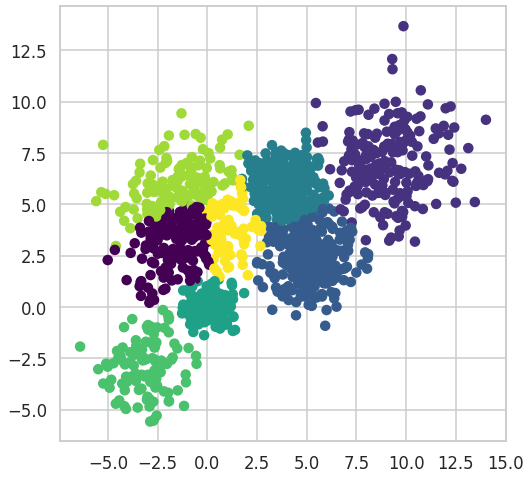

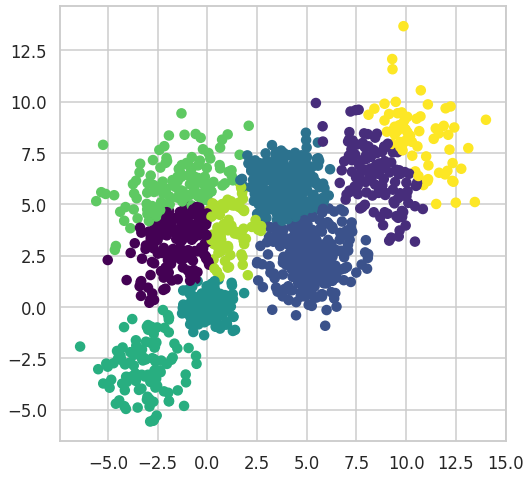

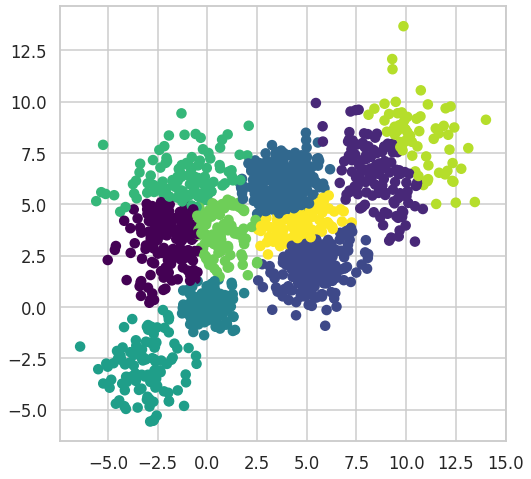

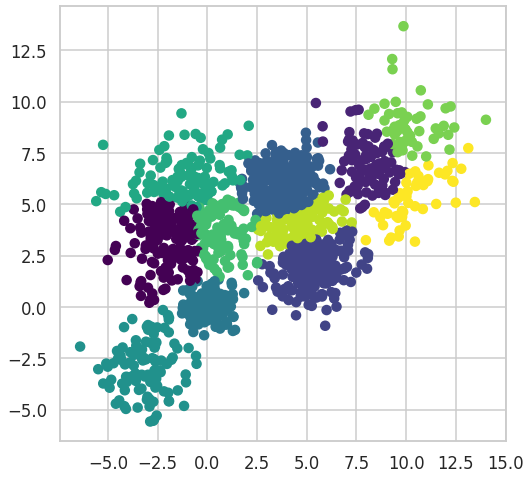

In [40]:
TheGaussian(Multi_blob_Data)

## iris data set 
The iris data set is test data set that is part of the Sklearn module 
which contains 150 records each with 4 features. All the features are represented by real numbers 

The data represents three classes 


In [43]:
from sklearn.datasets import load_iris
iris_data = load_iris()
iris_data.target[[10, 25, 50]]
#array([0, 0, 1])
list(iris_data.target_names)
['setosa', 'versicolor', 'virginica']


['setosa', 'versicolor', 'virginica']

The Original Iris Data


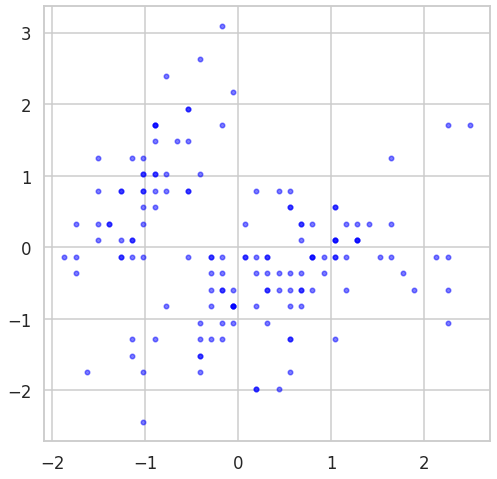

In [61]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
def ThePCA(dataset):

  pca = PCA(n_components=2)
  principal_components = pca.fit_transform(dataset)
  variance_ratios = pca.explained_variance_ratio_
  return principal_components,variance_ratios

def normalize(dataset):

  scaler = StandardScaler()
  normalized_data = scaler.fit_transform(dataset)
  return normalized_data

print("The Original Iris Data")
display_cluster(iris_data.data)


The Normalized Iris Data


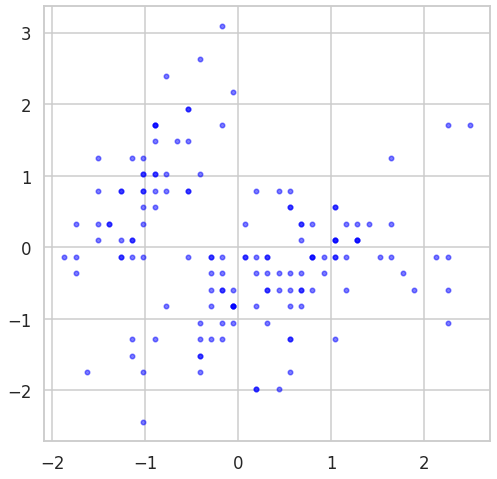

In [62]:
print("The Normalized Iris Data")
iris_data.data=normalize(iris_data.data)
display_cluster(iris_data.data)

Reducing The Features of Iris Data


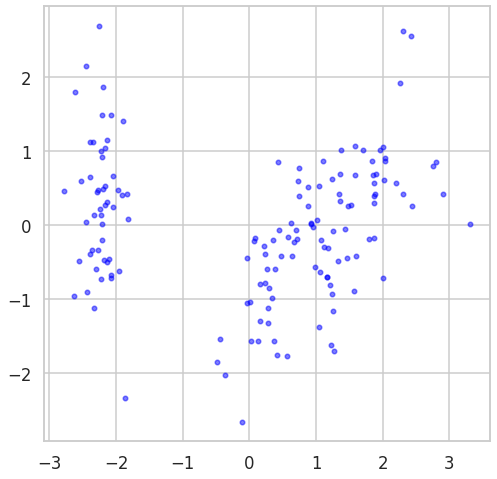

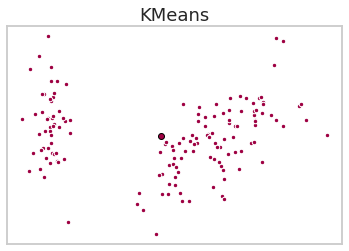

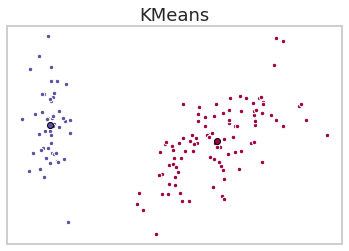

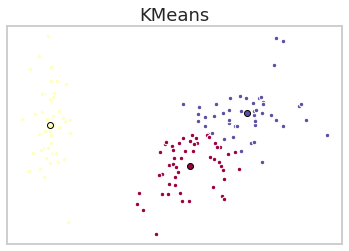

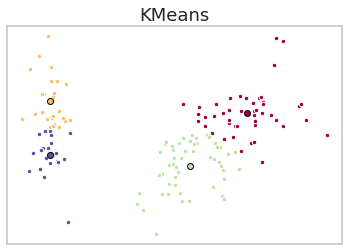

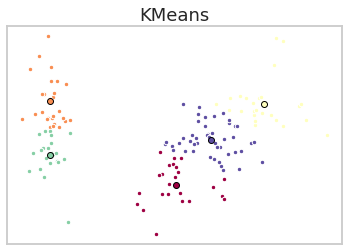

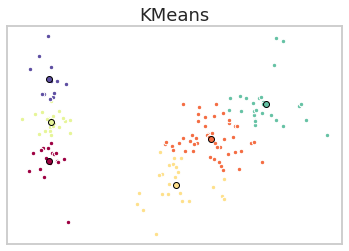

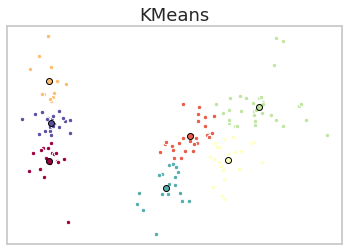

Best Silhouette Score: 0.615


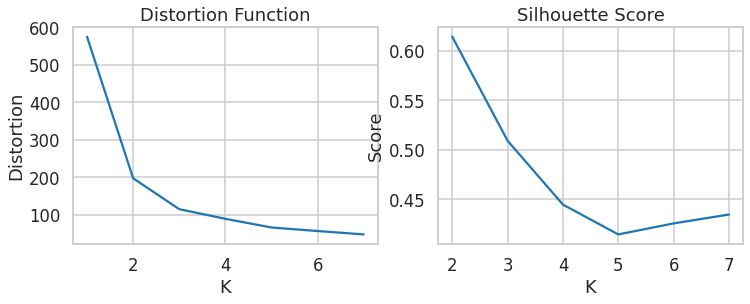

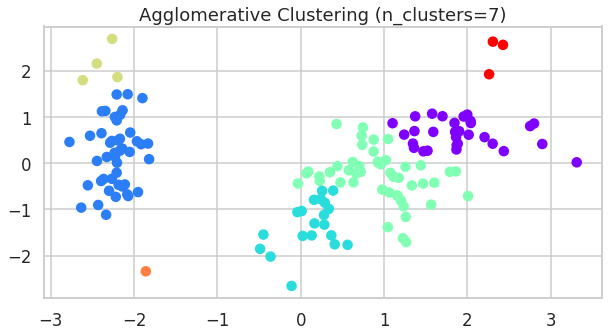

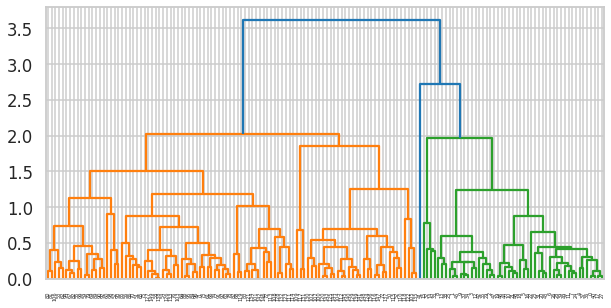

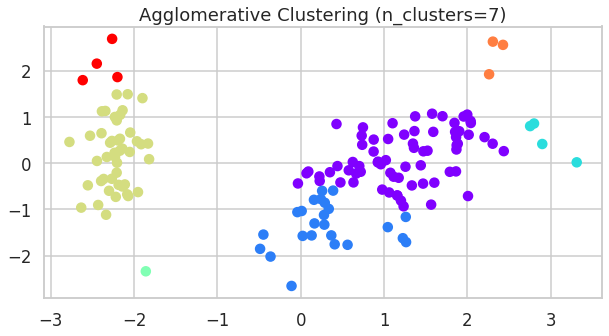

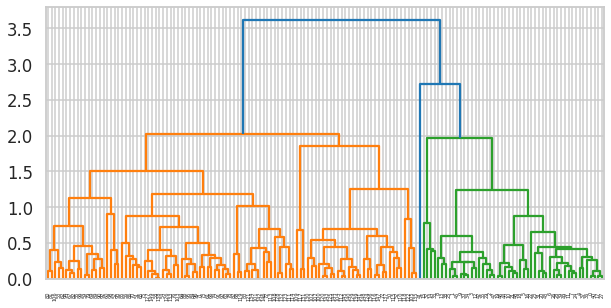

...

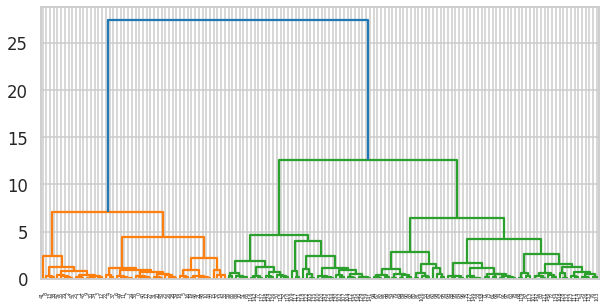

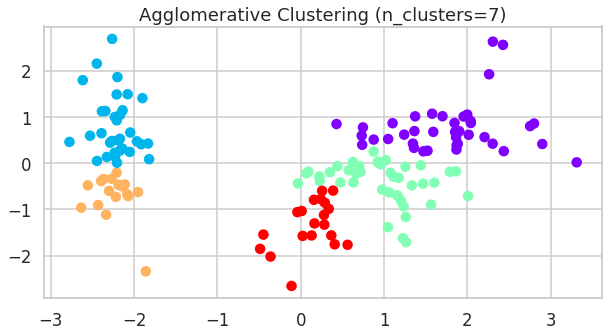

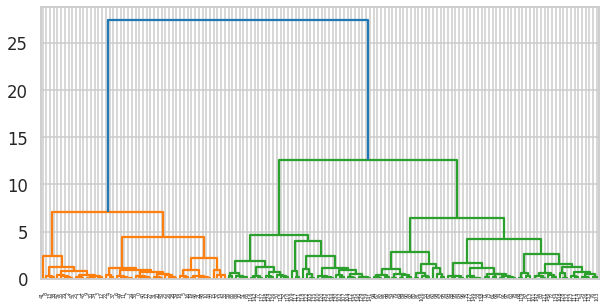

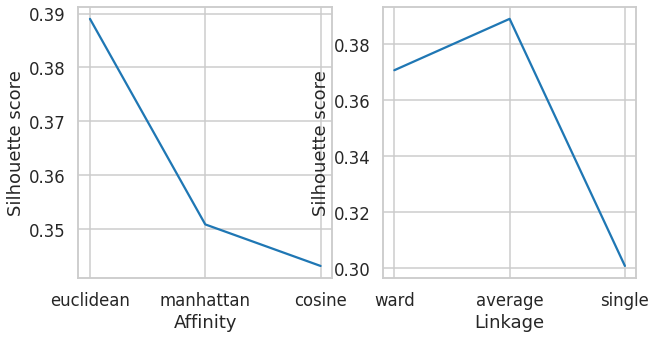

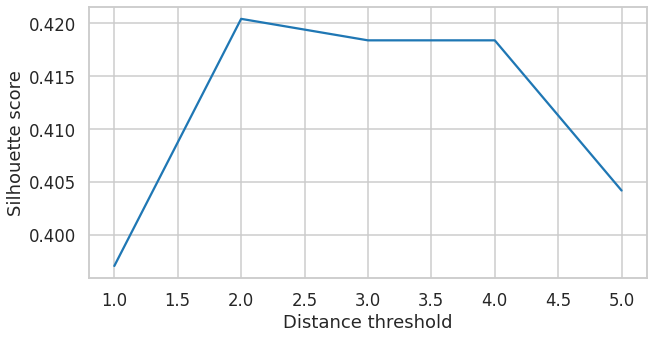

In [66]:
print("Reducing The Features of Iris Data")
principal_components,variance_ratios=ThePCA(iris_data.data)
display_cluster(principal_components)

k_means(principal_components)

Hierarchal_Clustering(principal_components,[1,2,3,4,5])


Total number of clusters: 0


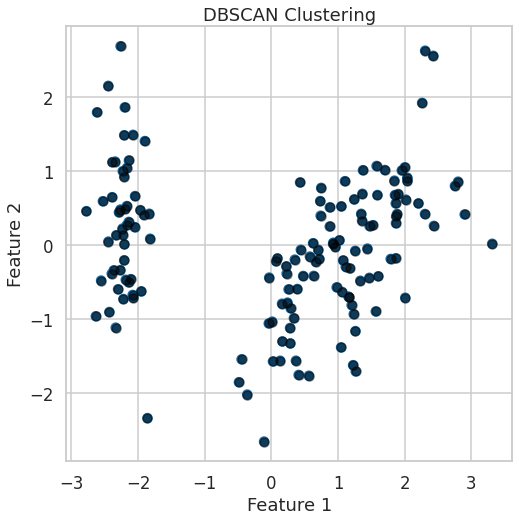

Total number of clusters: 0


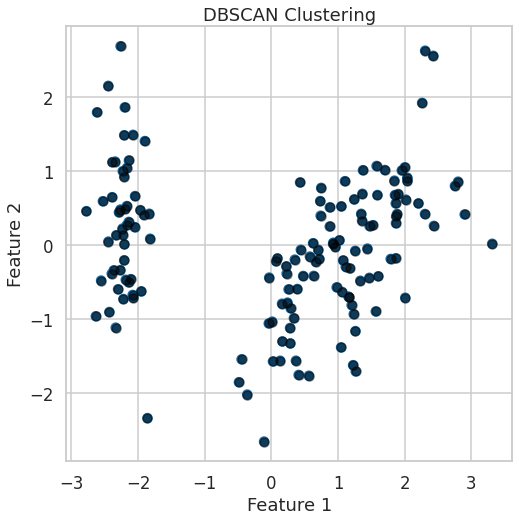

Total number of clusters: 0


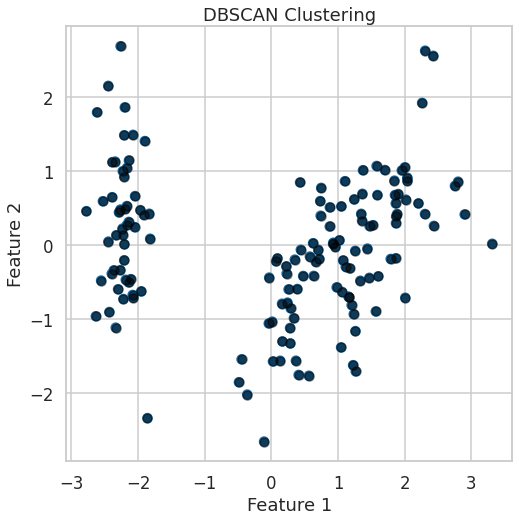

Total number of clusters: 2


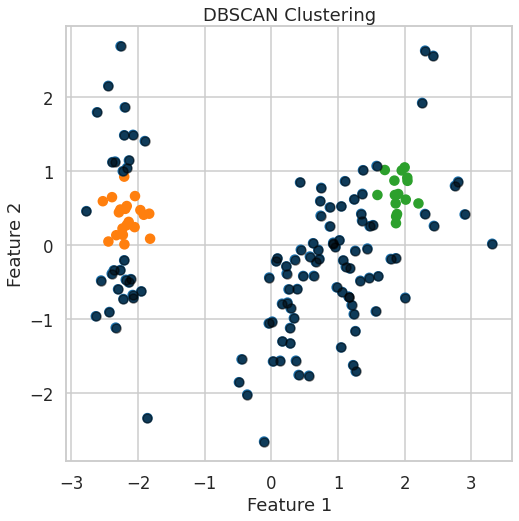

Total number of clusters: 2


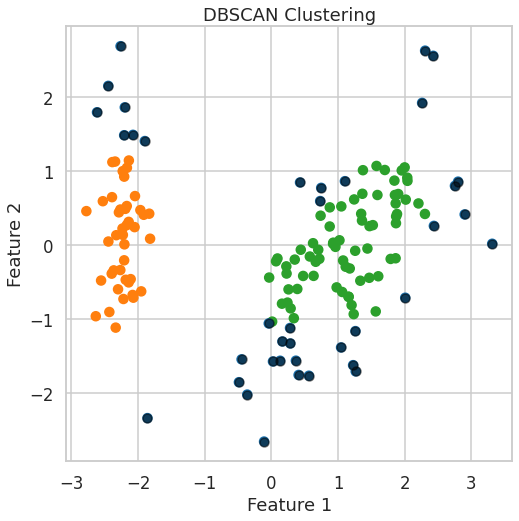

Total number of clusters: 2


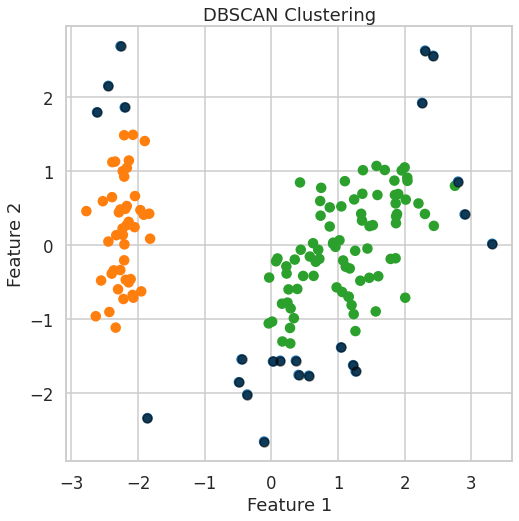

Total number of clusters: 2


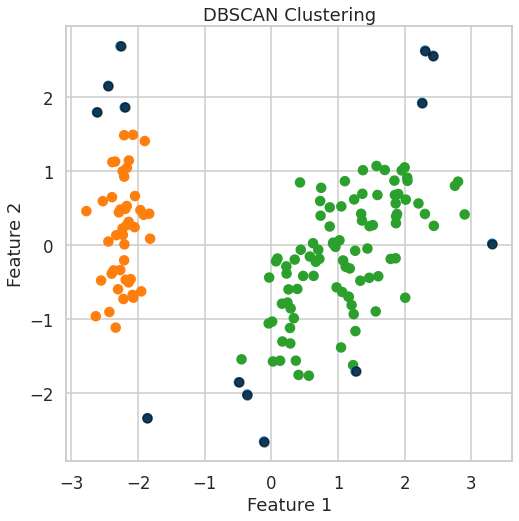

Total number of clusters: 2


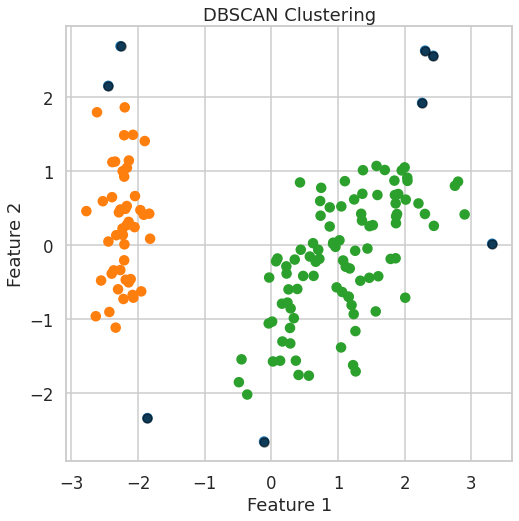

Total number of clusters: 2


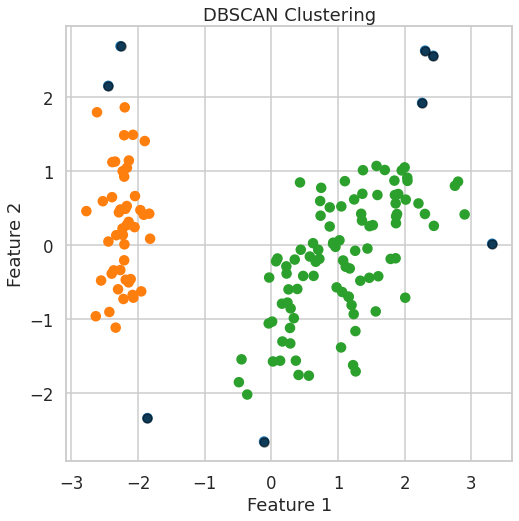

Total number of clusters: 2


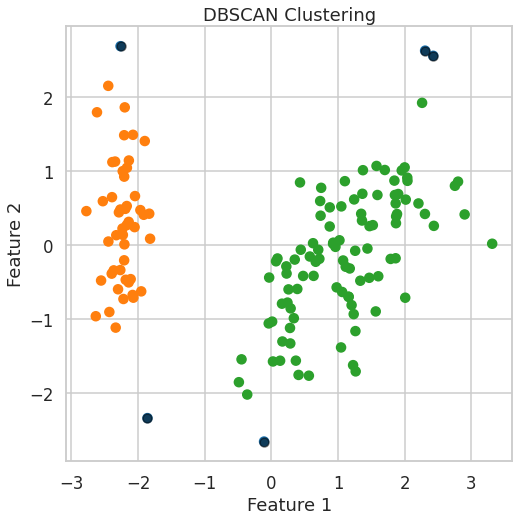

Total number of clusters: 2


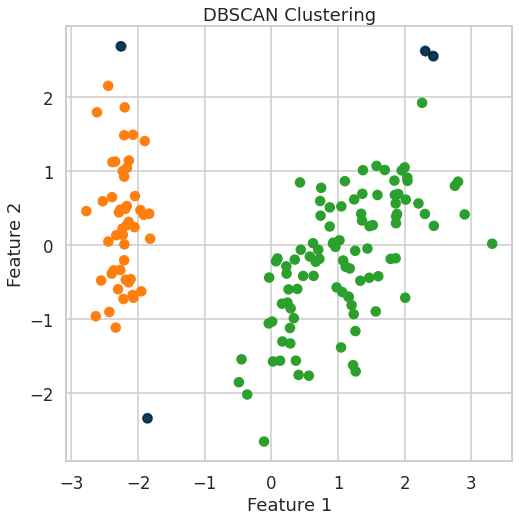

Total number of clusters: 2


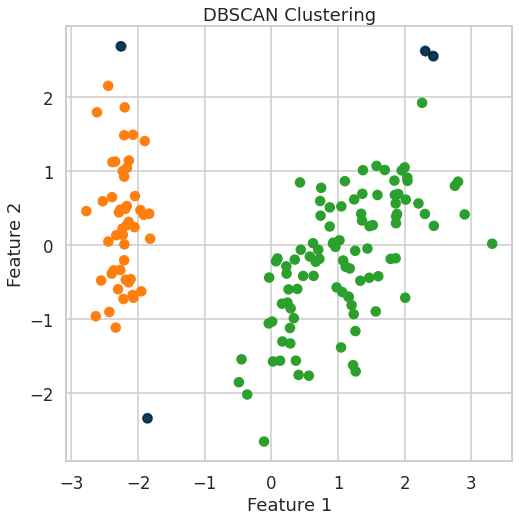

Total number of clusters: 2


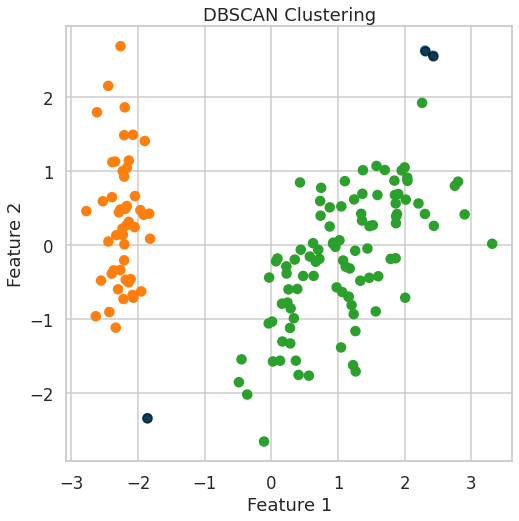

Total number of clusters: 1


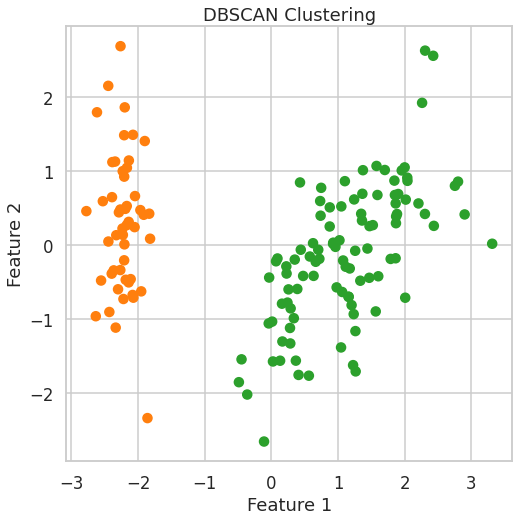

Total number of clusters: 1


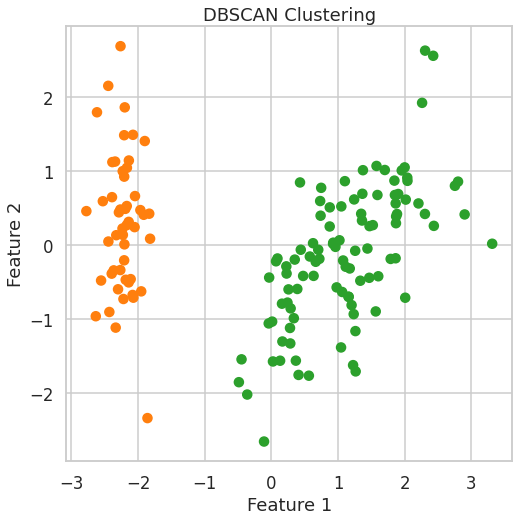

Total number of clusters: 1


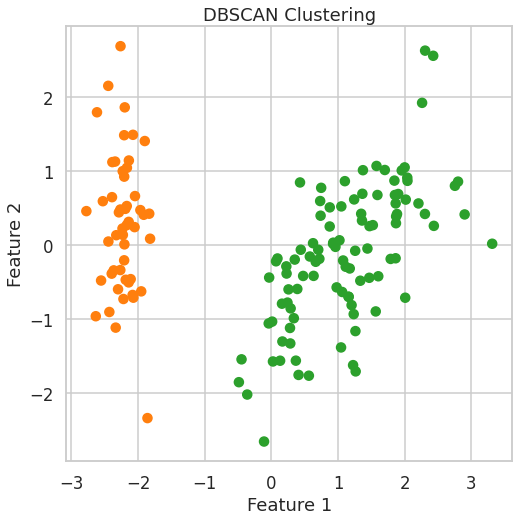

Total number of clusters: 1


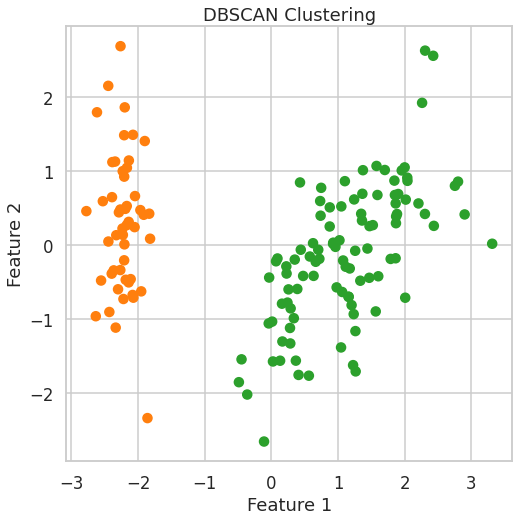

Total number of clusters: 0


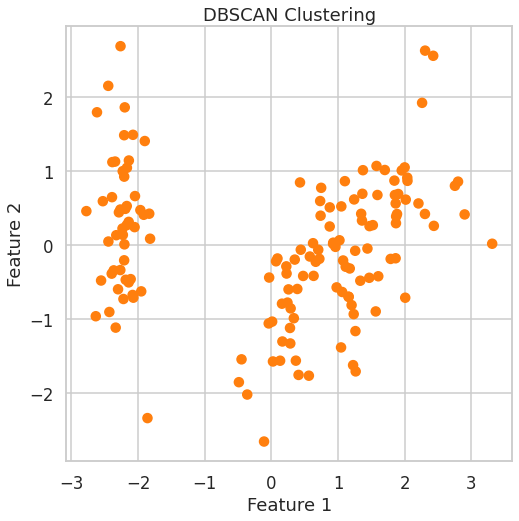

Total number of clusters: 0


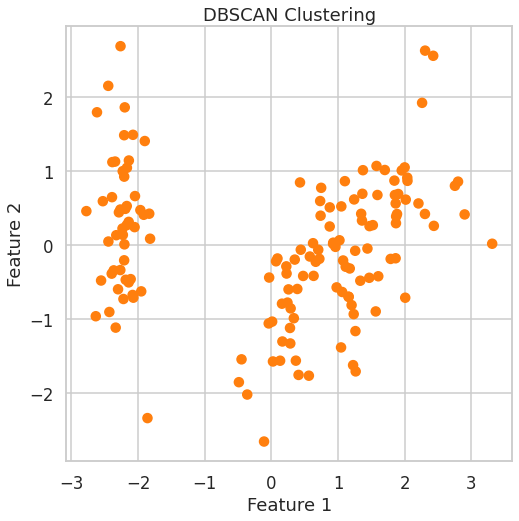

Total number of clusters: 0


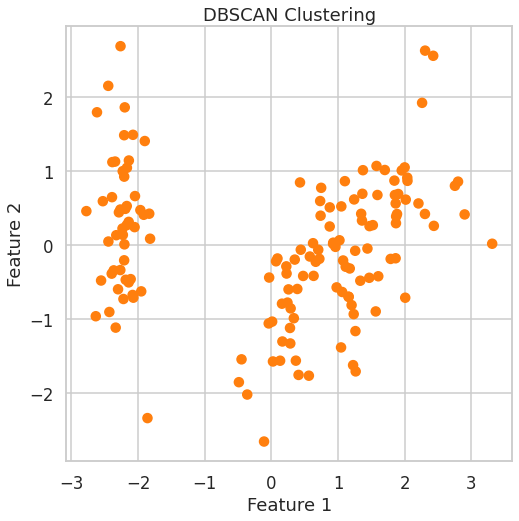

Total number of clusters: 0


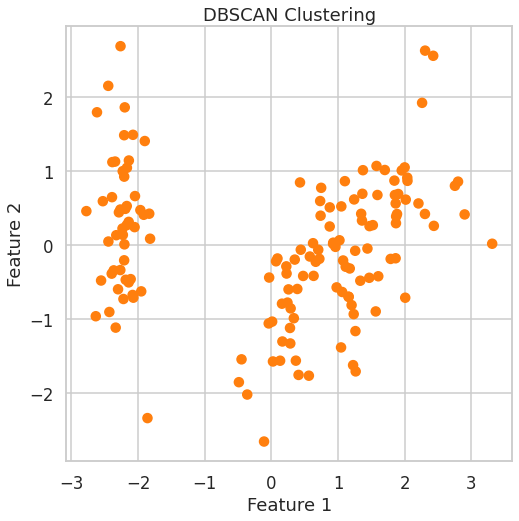

Total number of clusters: 0


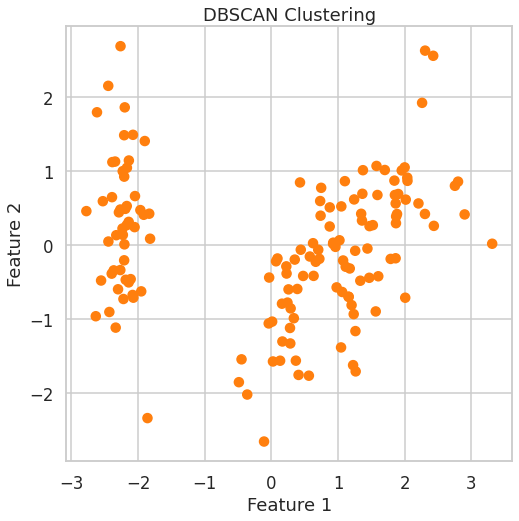

Total number of clusters: 0


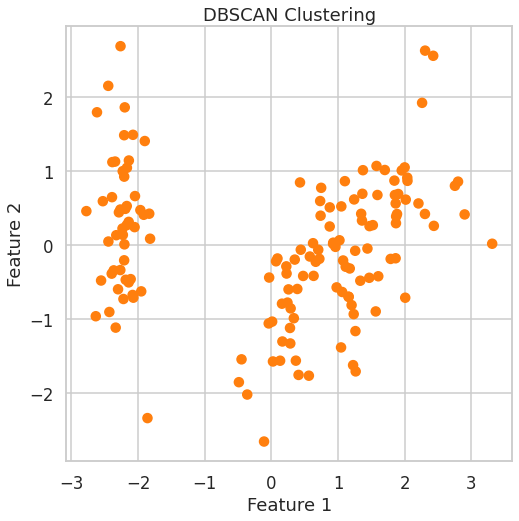

Total number of clusters: 0


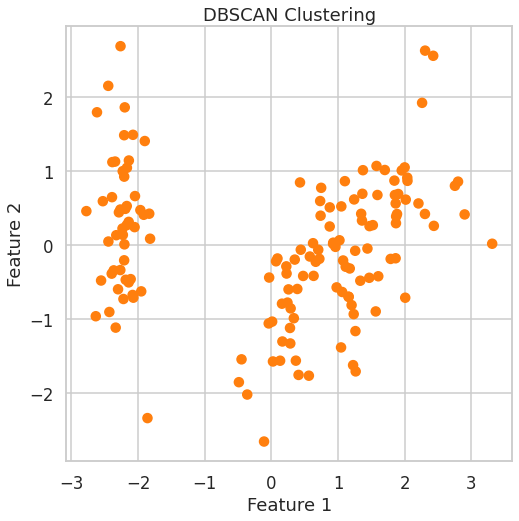

Total number of clusters: 0


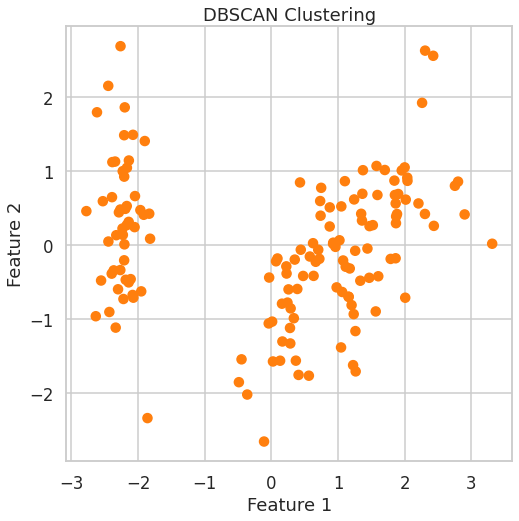

Total number of clusters: 0


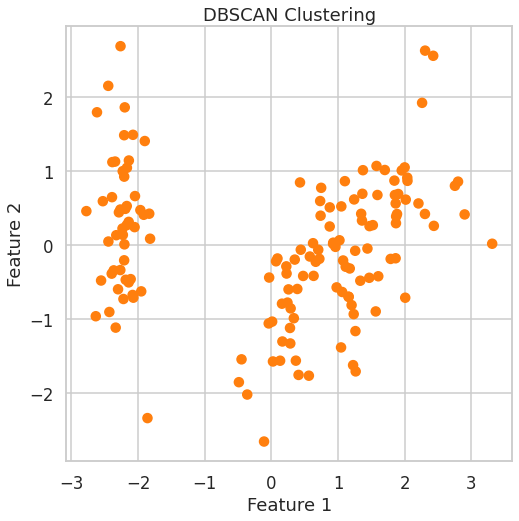

Total number of clusters: 0


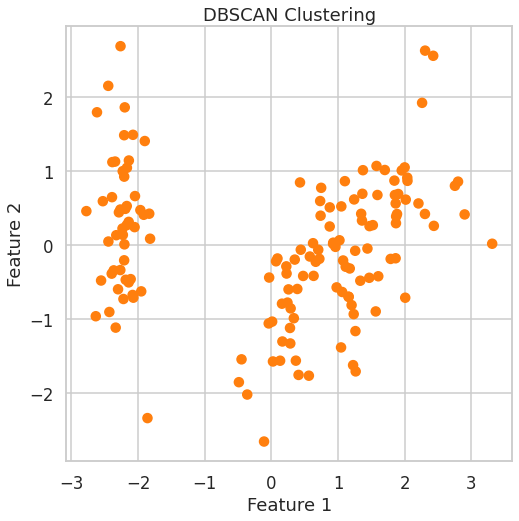

Total number of clusters: 0


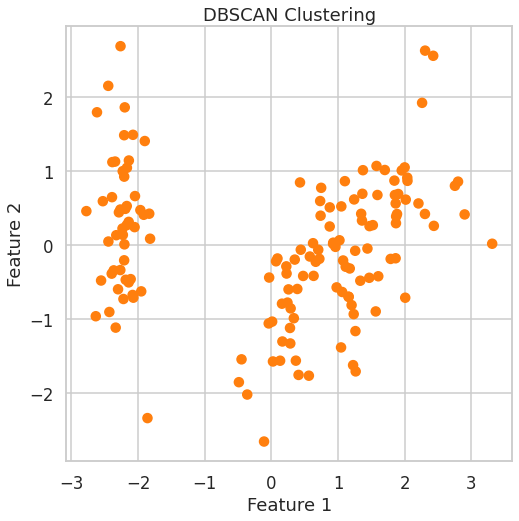

Total number of clusters: 0


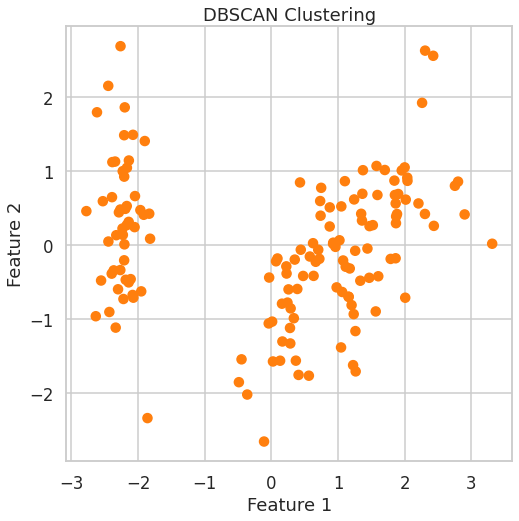

Total number of clusters: 2


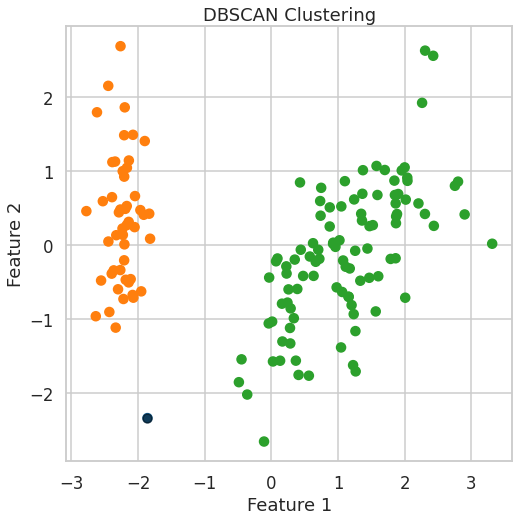

Total number of clusters: 2


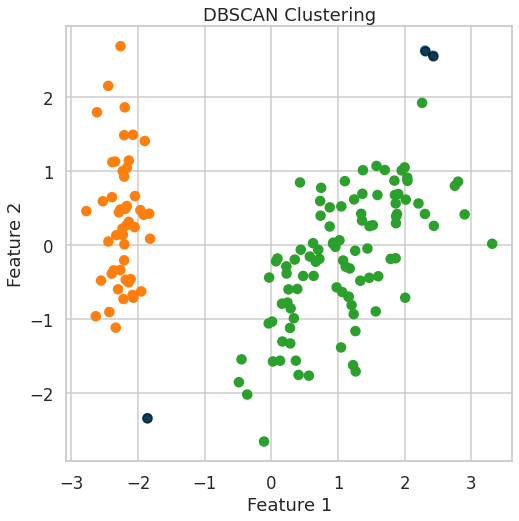

Total number of clusters: 2


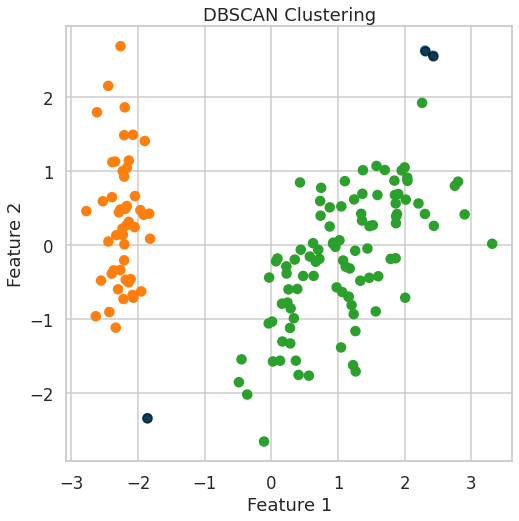

Total number of clusters: 2


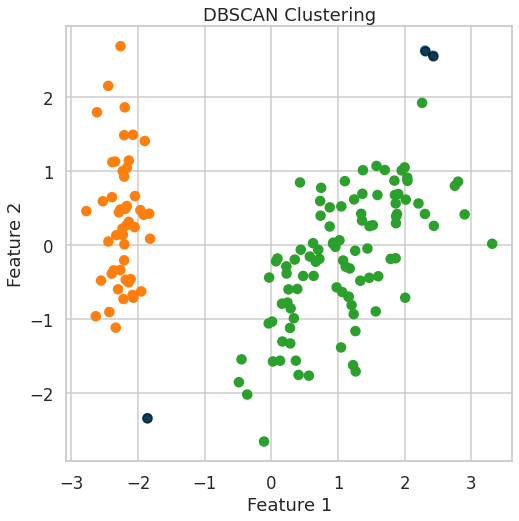

Total number of clusters: 2


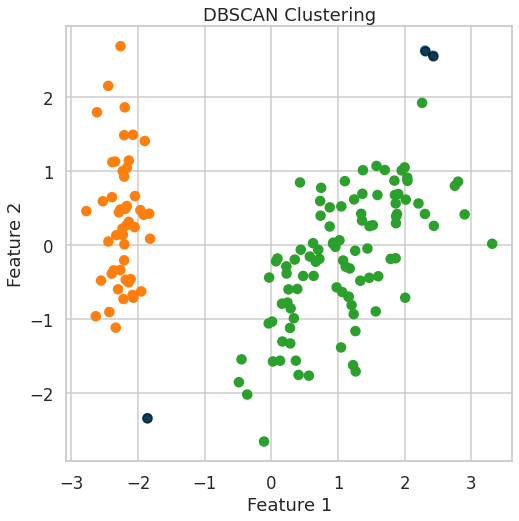

Total number of clusters: 2


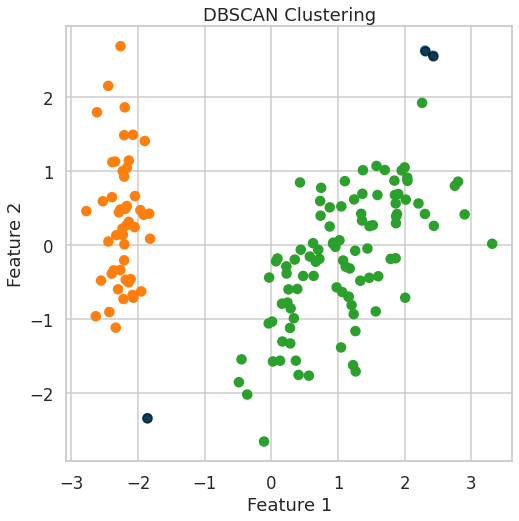

Total number of clusters: 2


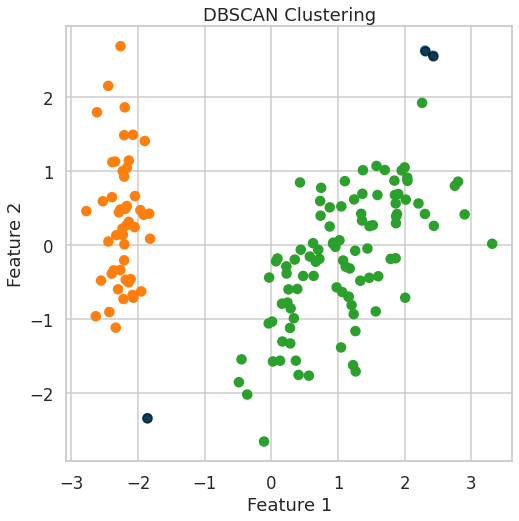

Total number of clusters: 2


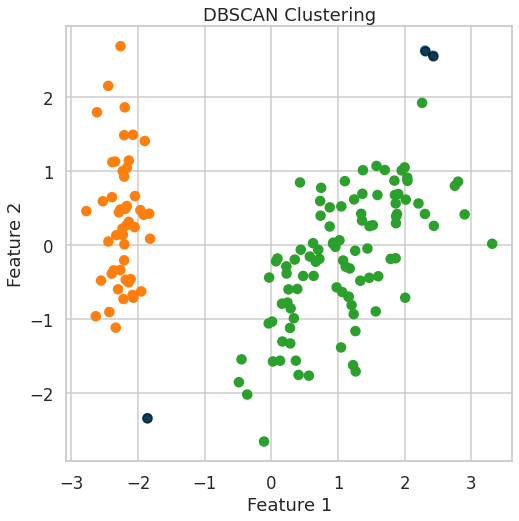

Total number of clusters: 2


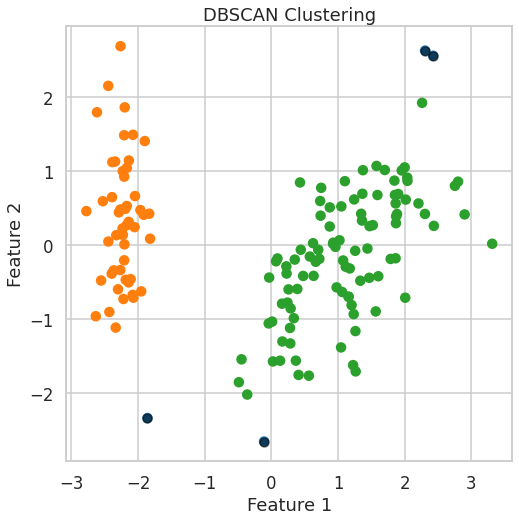

Total number of clusters: 2


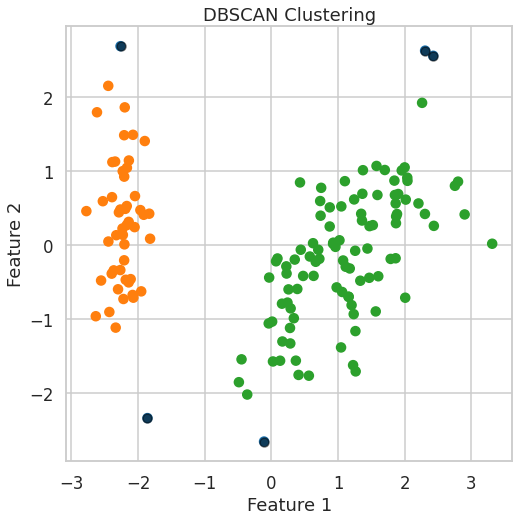

Total number of clusters: 2


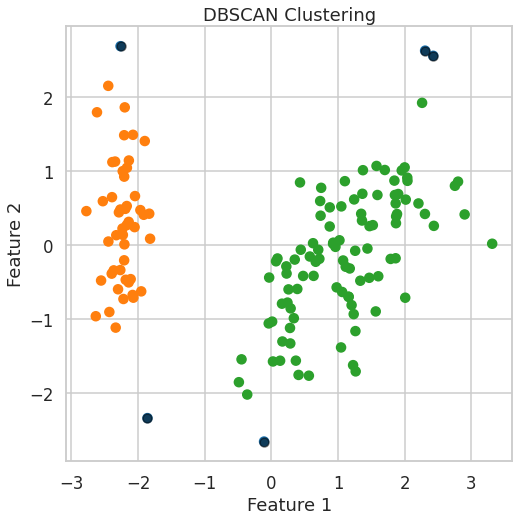

Total number of clusters: 2


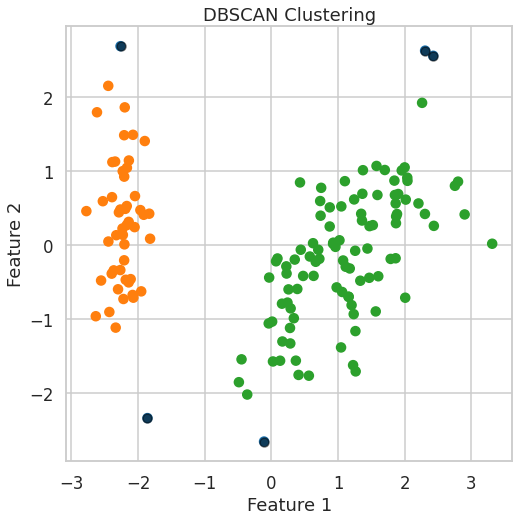

Total number of clusters: 2


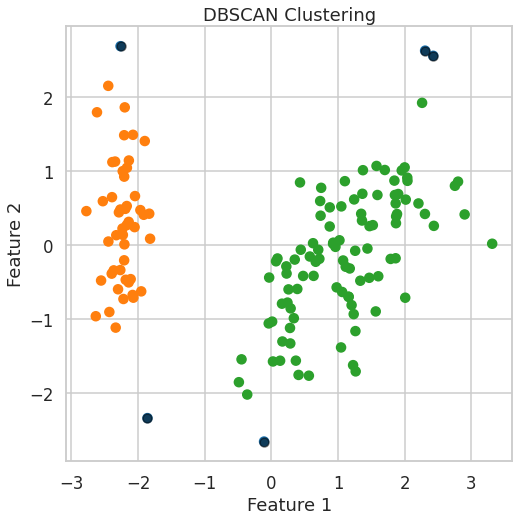

Total number of clusters: 2


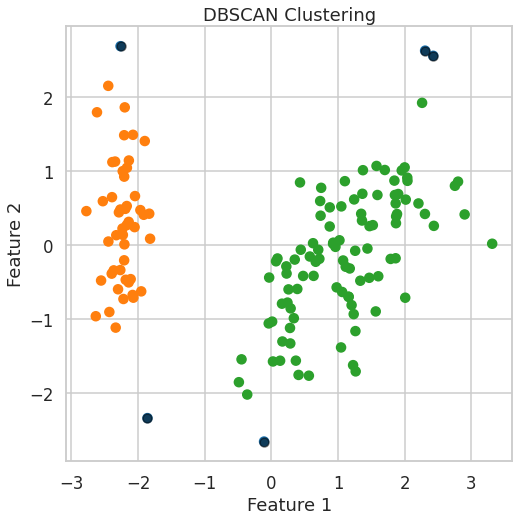

Total number of clusters: 2


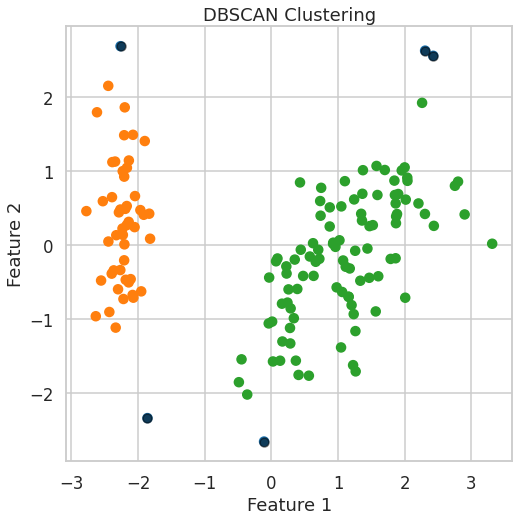

Total number of clusters: 2


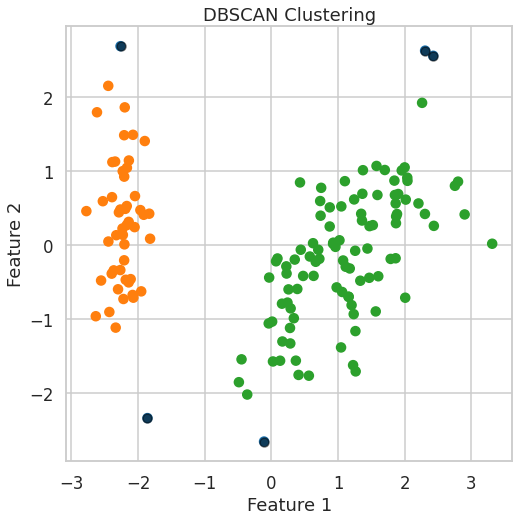

Total number of clusters: 2


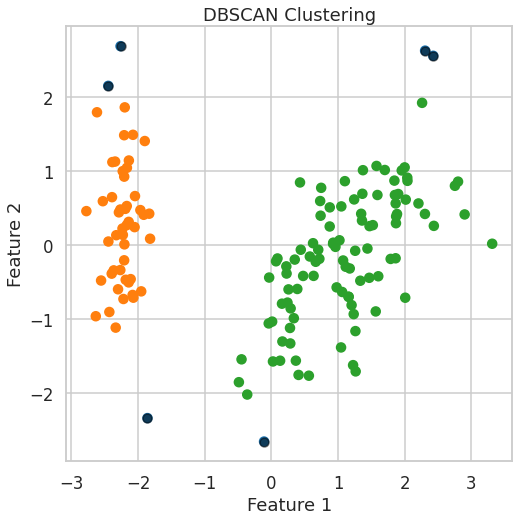

Total number of clusters: 2


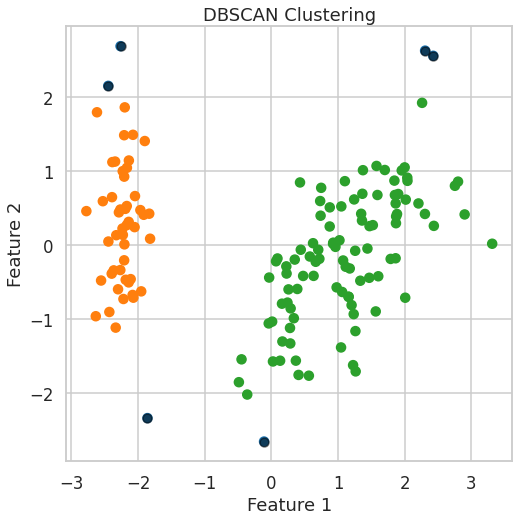

Total number of clusters: 2


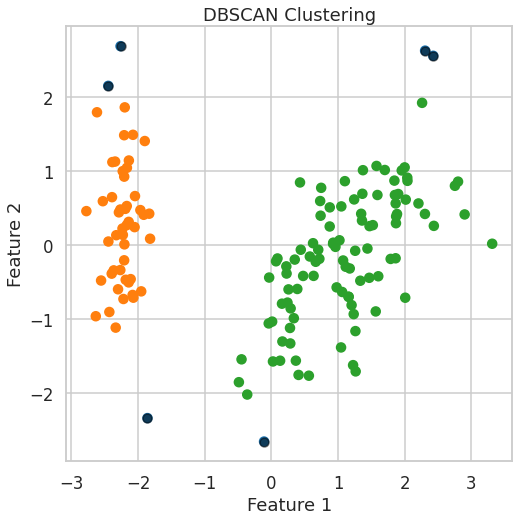

Total number of clusters: 2


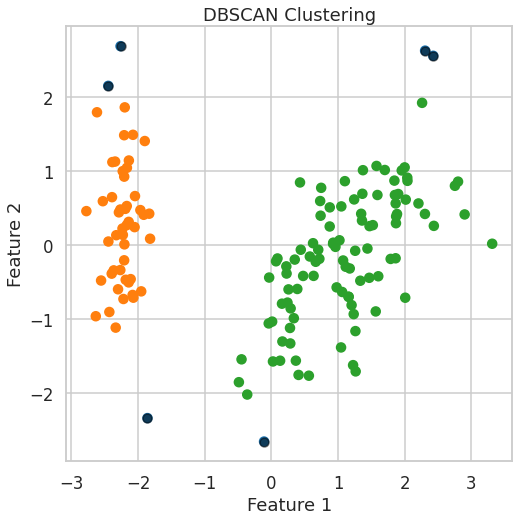

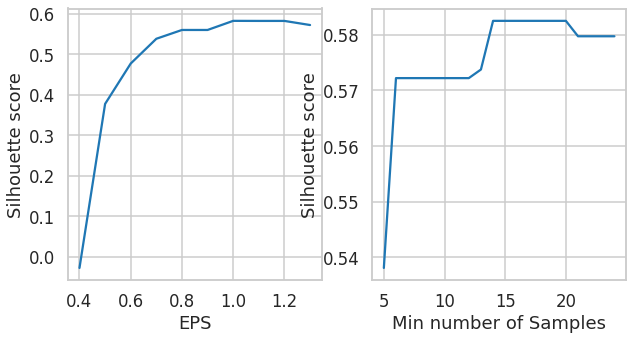

In [68]:
DB_Scanning(principal_components)

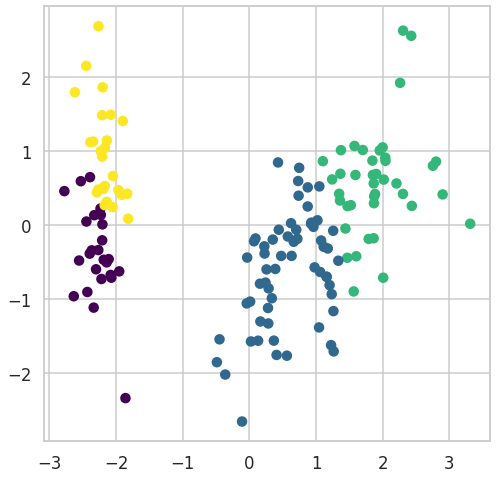

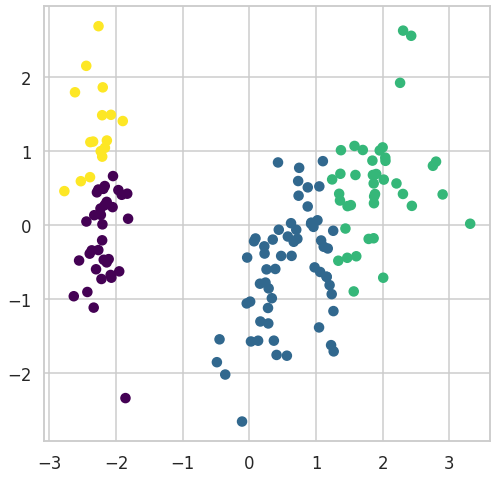

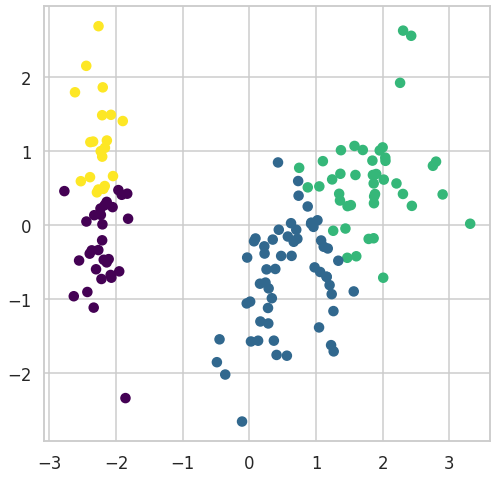

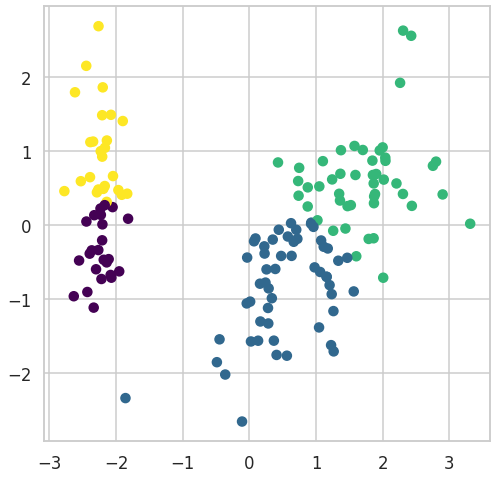

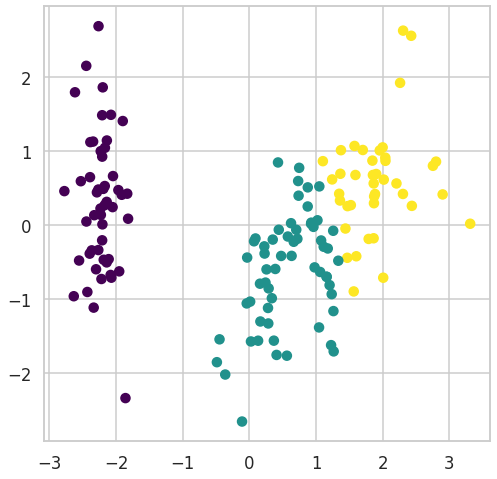

...

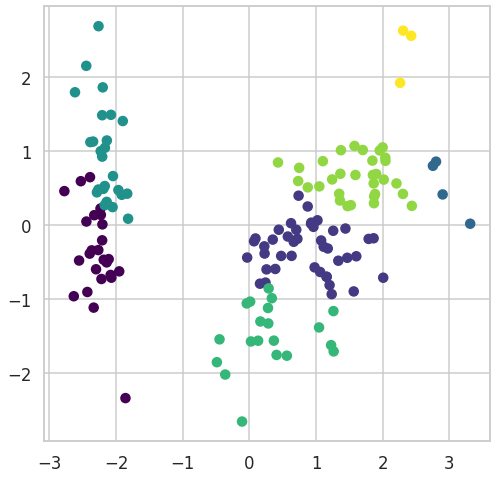

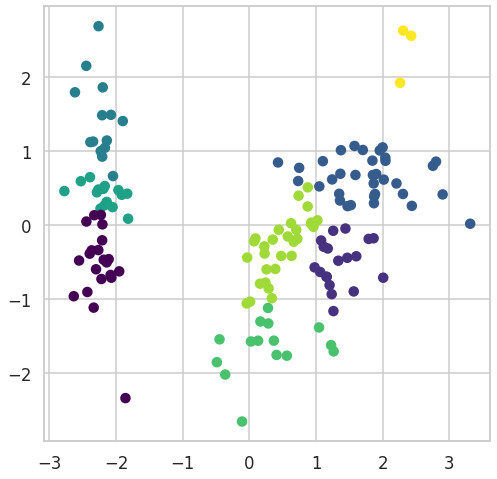

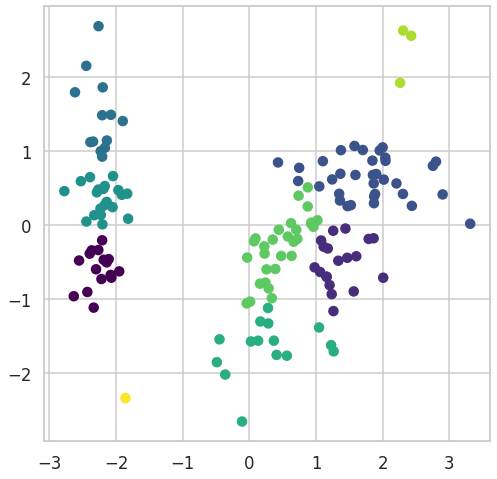

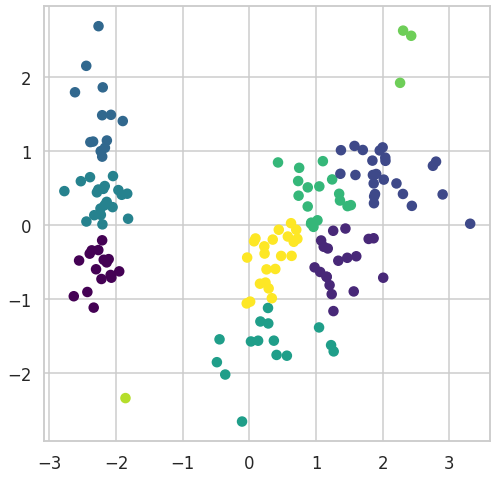

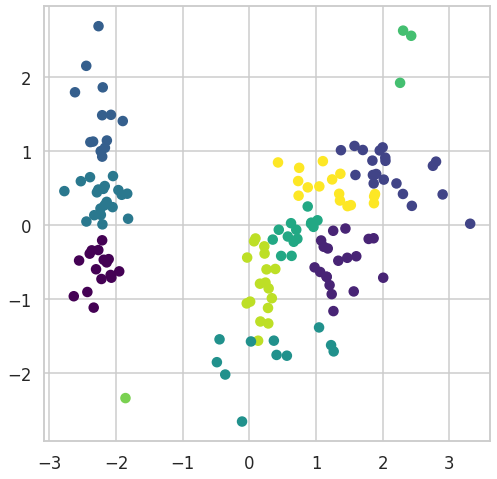

In [69]:
TheGaussian(principal_components)

* Repeat all the above clustering approaches and steps on the above data 
* Normalize the data then repeat all the above steps 
* Compare between the different clustering approaches 

## Customer dataset
Repeat all the above on the customer data set 

In [73]:
from google.colab import files
import pandas as pd

# Upload the CSV file from your local machine to Colab
uploaded = files.upload()

# Read the uploaded CSV file into a Pandas dataframe
df = pd.read_csv('Customer data.csv', header=None)
df=df[1:]


Saving Customer data.csv to Customer data (3).csv


Original Data, first two features
[['100000001' '0']
 ['100000002' '1']
 ['100000003' '0']
 ...
 ['100001998' '0']
 ['100001999' '1']
 ['100002000' '0']]


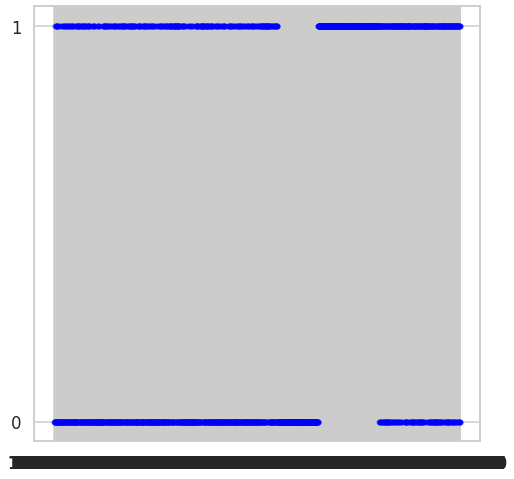

In [74]:
print("Original Data, first two features")
df_subset = np.array(df.iloc[:, 0:2])
print(df_subset)
display_cluster(df_subset)

Original Data, second two features
[['67' '2']
 ['22' '1']
 ['49' '1']
 ...
 ['31' '0']
 ['24' '1']
 ['25' '0']]


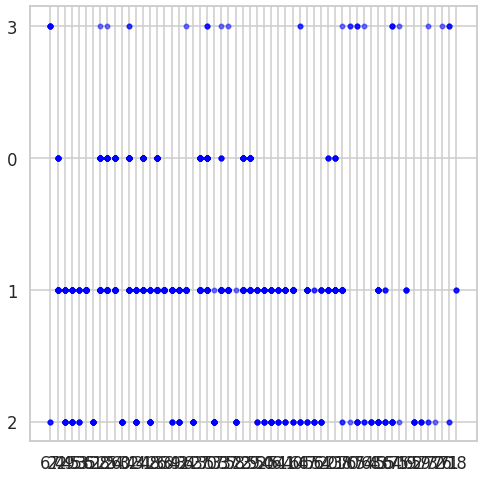

In [75]:
print("Original Data, second two features")
df_subset1 = np.array(df.iloc[:, 3:5])
print(df_subset1)
display_cluster(df_subset1)

Normalized Data, first two features
[[-1.731185   -0.91739884]
 [-1.72945295  1.09003844]
 [-1.7277209  -0.91739884]
 ...
 [ 1.7277209  -0.91739884]
 [ 1.72945295  1.09003844]
 [ 1.731185   -0.91739884]]


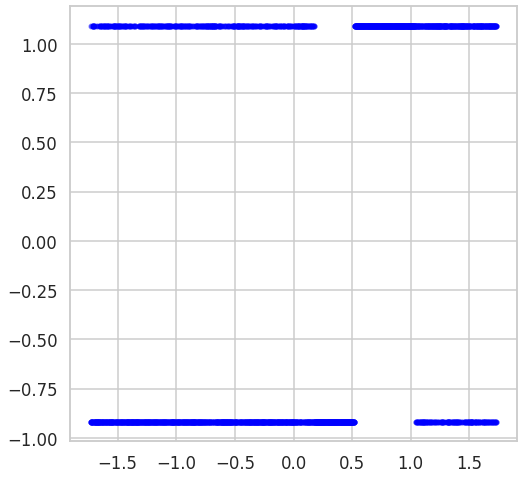

In [76]:
df=normalize(df)
print("Normalized Data, first two features")
dfnorm_subset = np.array(df[:, 0:2])
print(dfnorm_subset)
display_cluster(dfnorm_subset)

Normalized Data, second two features
[[-1.731185   -0.91739884]
 [-1.72945295  1.09003844]
 [-1.7277209  -0.91739884]
 ...
 [ 1.7277209  -0.91739884]
 [ 1.72945295  1.09003844]
 [ 1.731185   -0.91739884]]


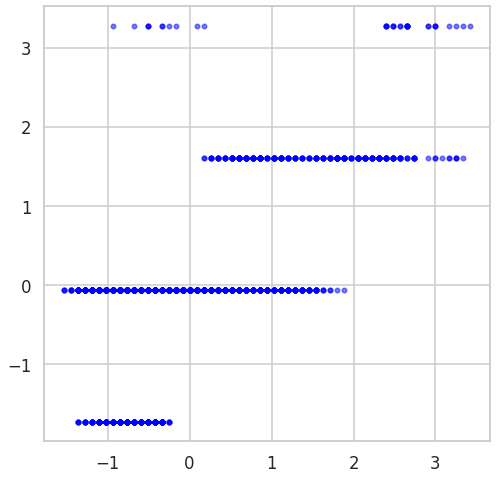

In [77]:
print("Normalized Data, second two features")
dfnorm_subset1 = np.array(df[:, 3:5])
print(dfnorm_subset)
display_cluster(dfnorm_subset1)

Normalized Data, third two features
[[ 0.29682303  1.552326  ]
 [ 0.29682303  1.552326  ]
 [-1.26952539 -0.90972951]
 ...
 [-1.26952539 -0.90972951]
 [-1.26952539 -0.90972951]
 [-1.26952539 -0.90972951]]


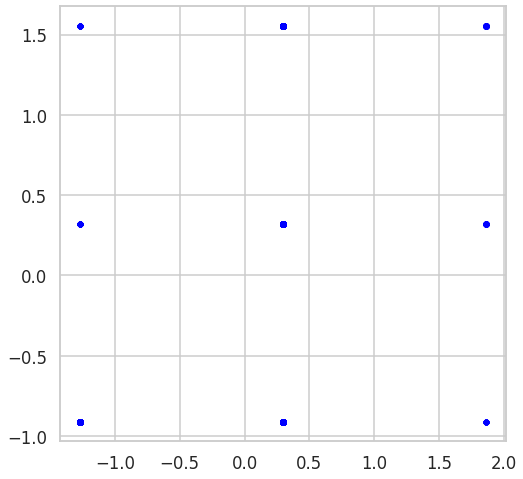

In [78]:
print("Normalized Data, third two features")
dfnorm_subset2 = np.array(df[:, 6:8])
print(dfnorm_subset2)
display_cluster(dfnorm_subset2)

Reduced Features


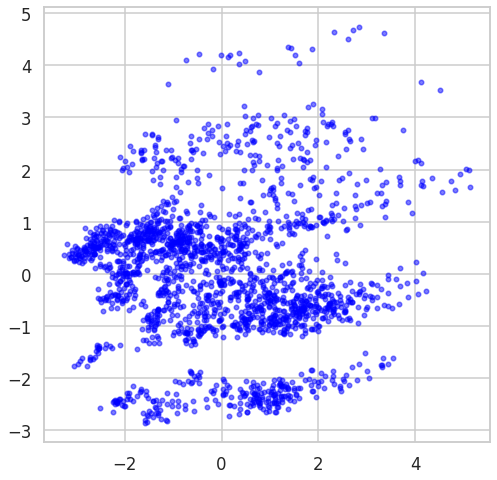

In [81]:
reduced_data,ratios=ThePCA(df)
print("Reduced Features")
display_cluster(reduced_data)

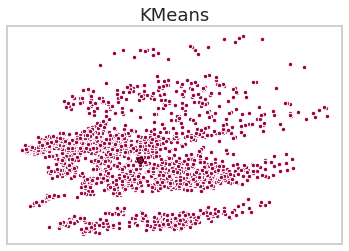

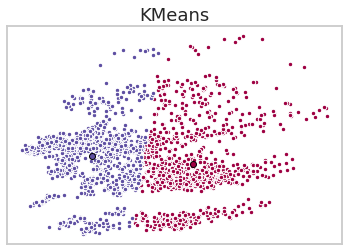

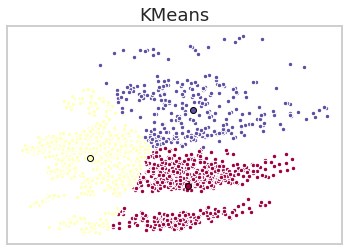

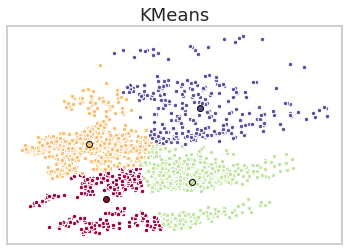

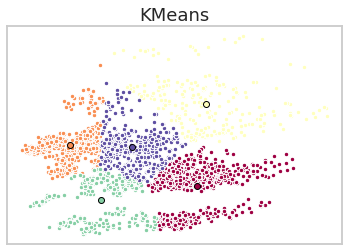

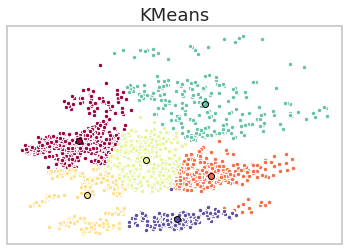

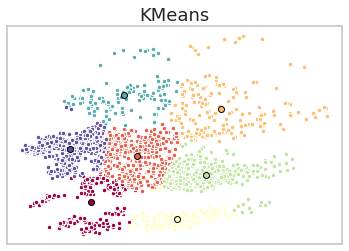

Best Silhouette Score: 0.427


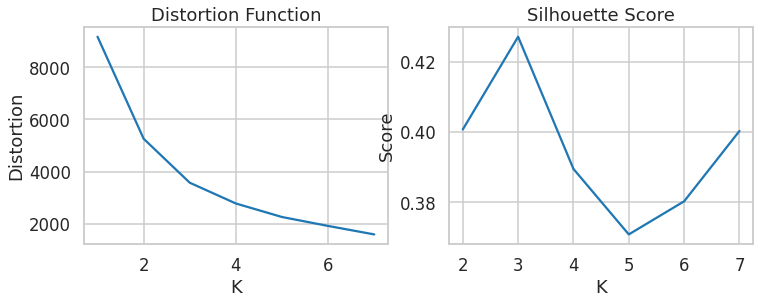

In [82]:
k_means(reduced_data)

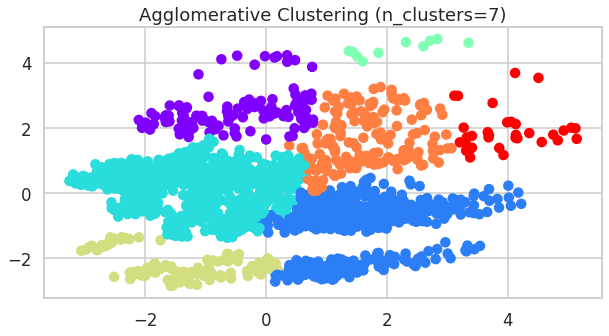

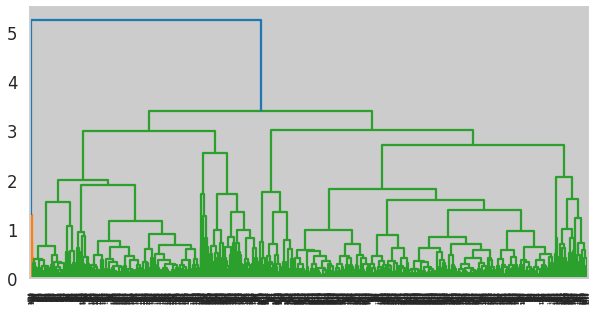

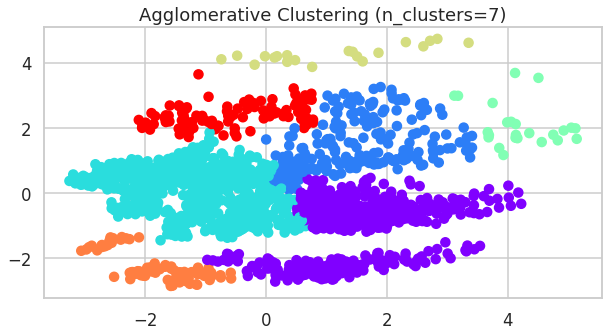

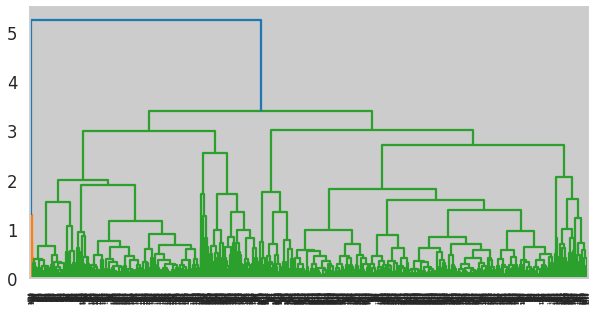

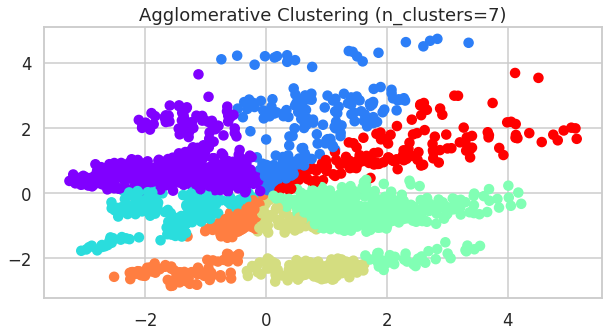

...

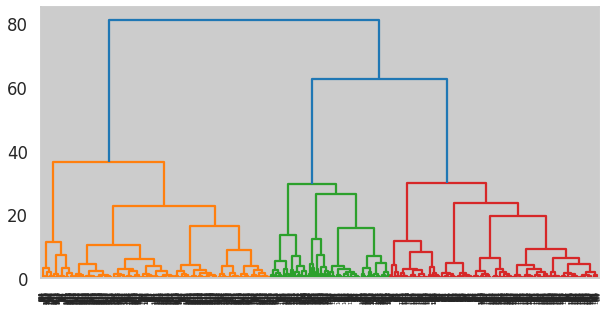

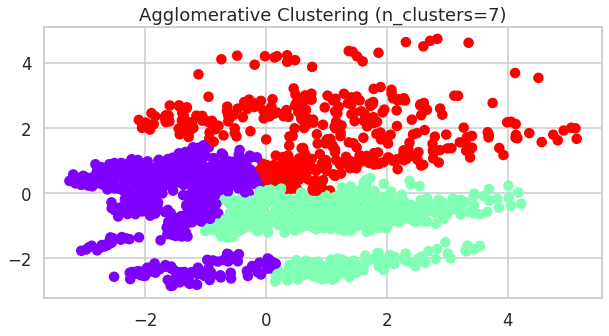

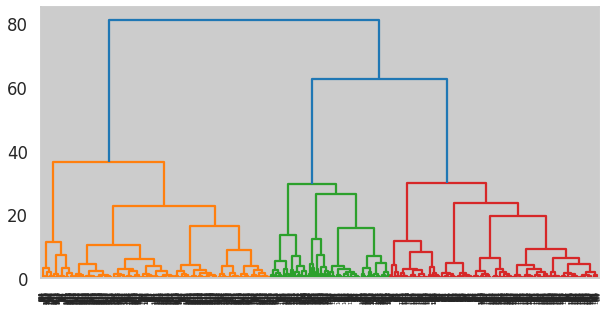

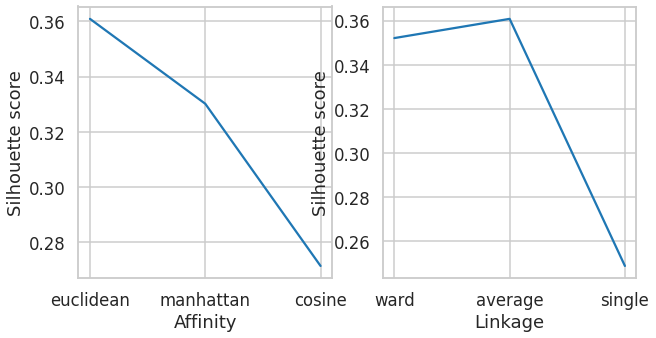

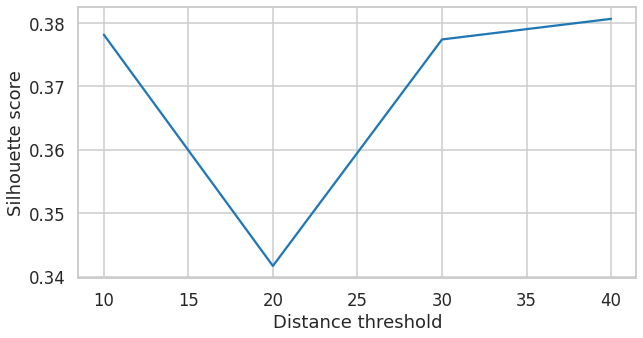

In [84]:
Hierarchal_Clustering(reduced_data,[10,20,30,40])

Total number of clusters: 5


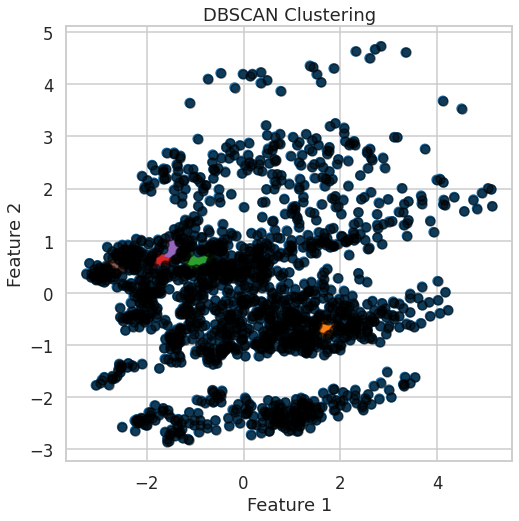

Total number of clusters: 7


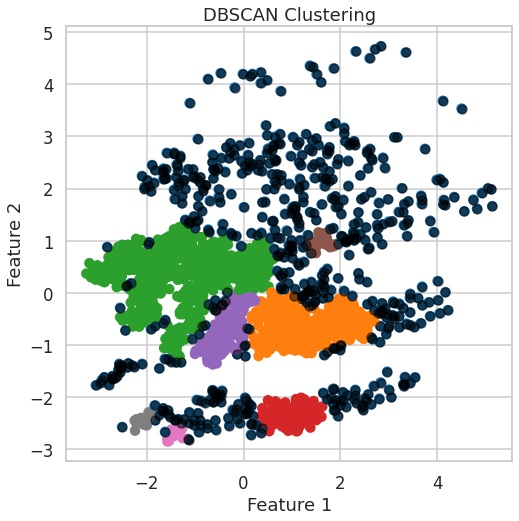

Total number of clusters: 6


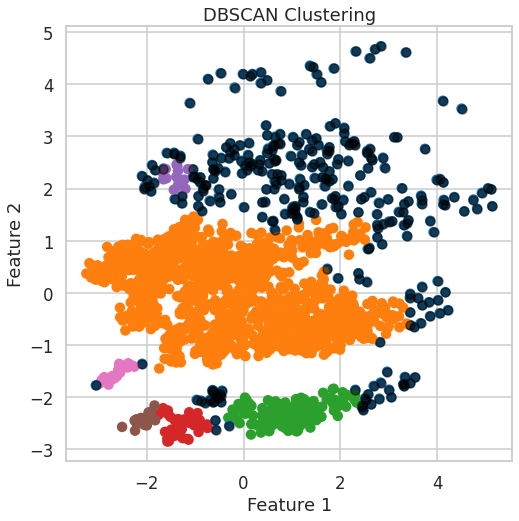

Total number of clusters: 4


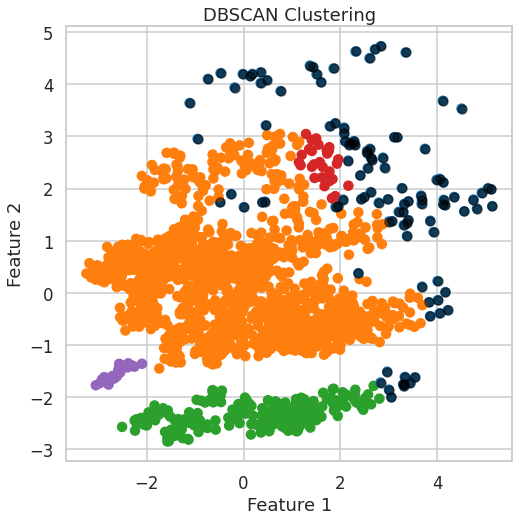

Total number of clusters: 2


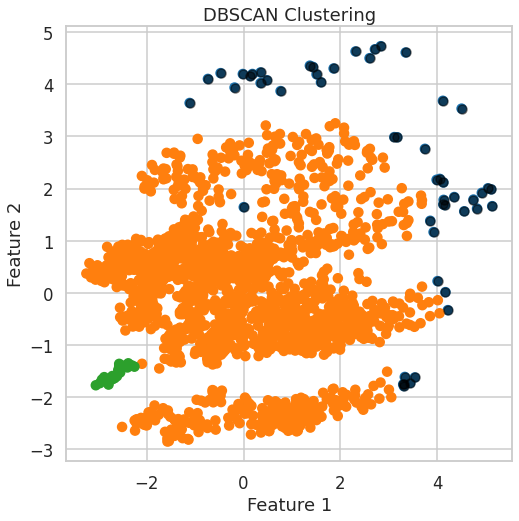

Total number of clusters: 1


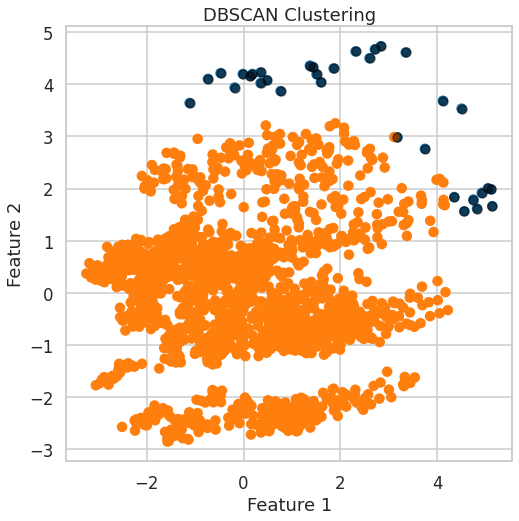

Total number of clusters: 1


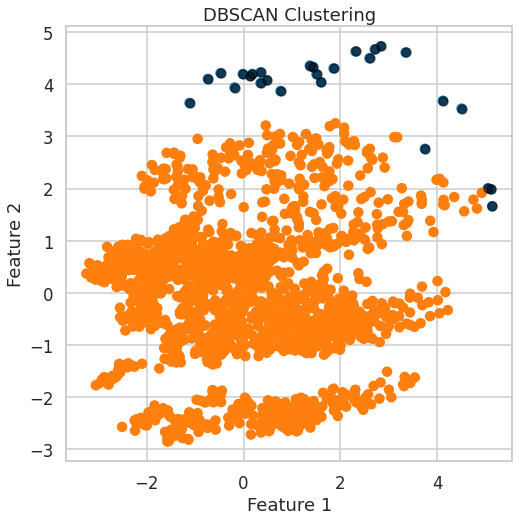

Total number of clusters: 1


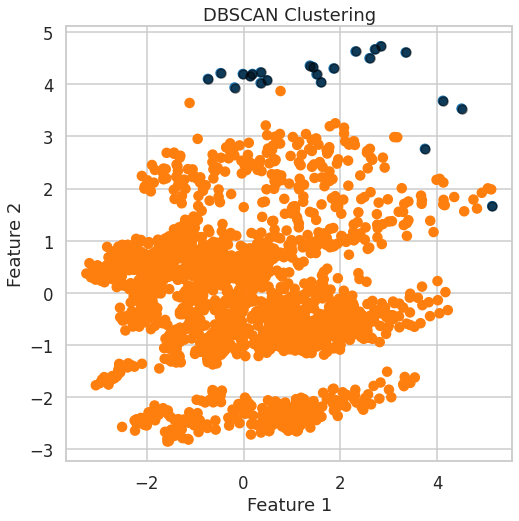

Total number of clusters: 1


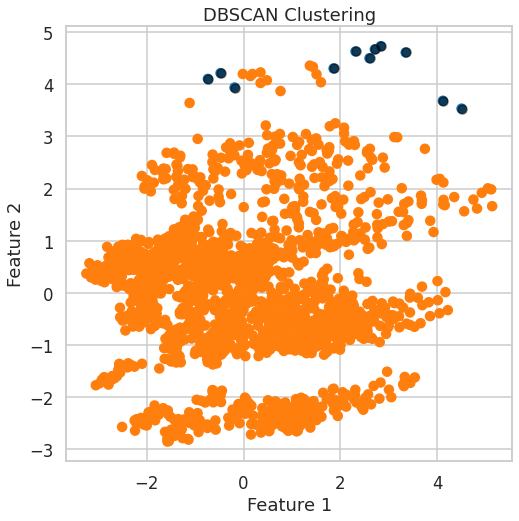

Total number of clusters: 1


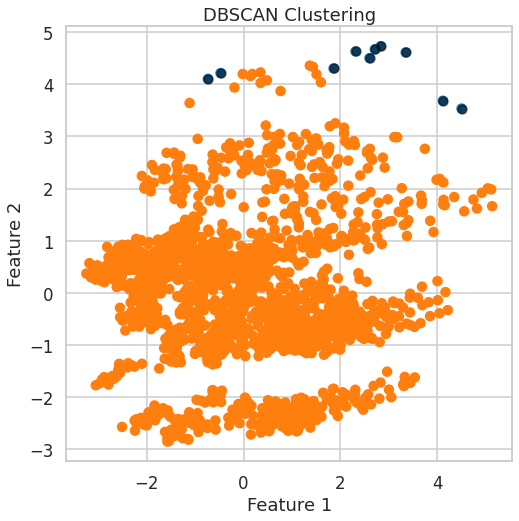

Total number of clusters: 1


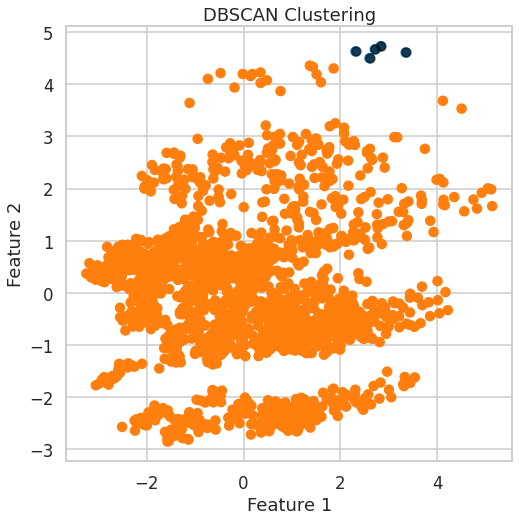

Total number of clusters: 1


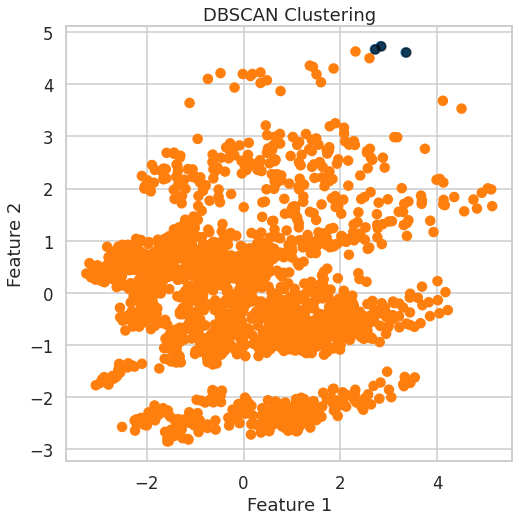

Total number of clusters: 1


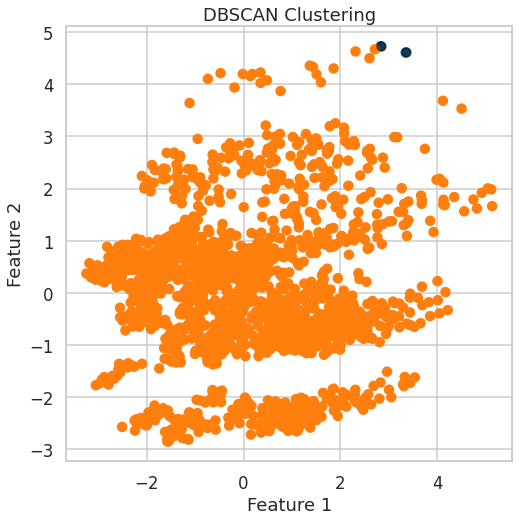

Total number of clusters: 1


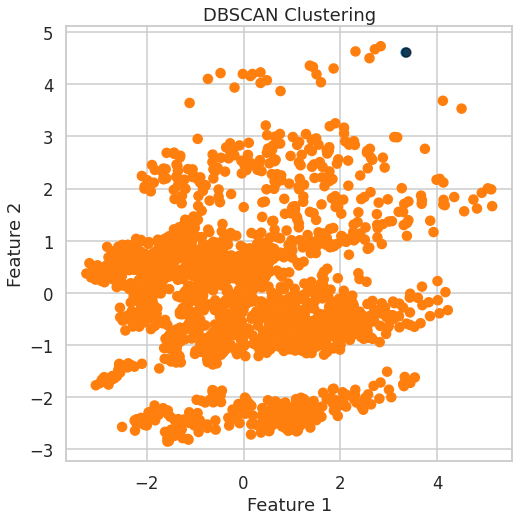

Total number of clusters: 1


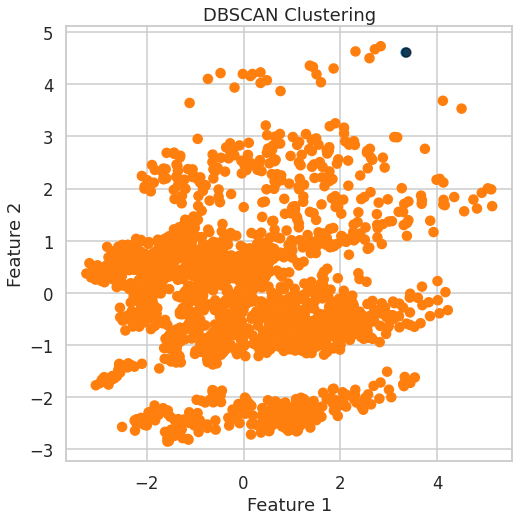

Total number of clusters: 0


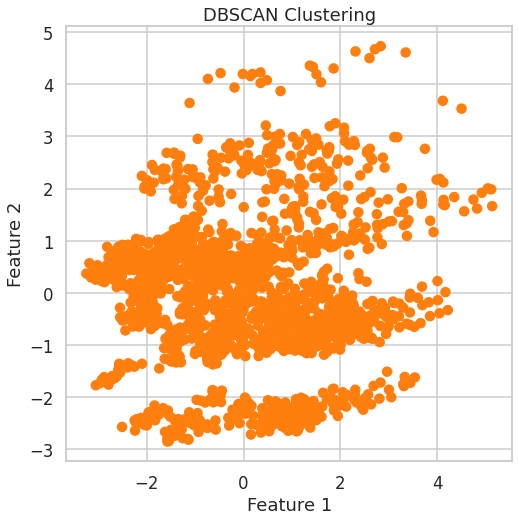

Total number of clusters: 0


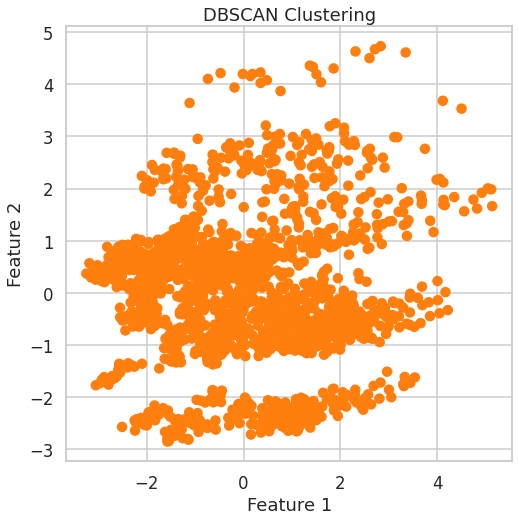

Total number of clusters: 0


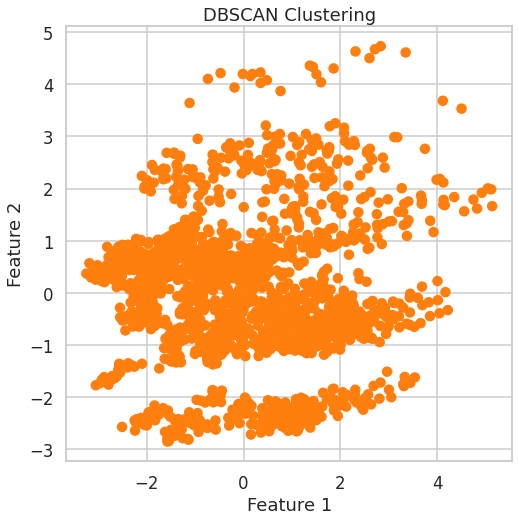

Total number of clusters: 0


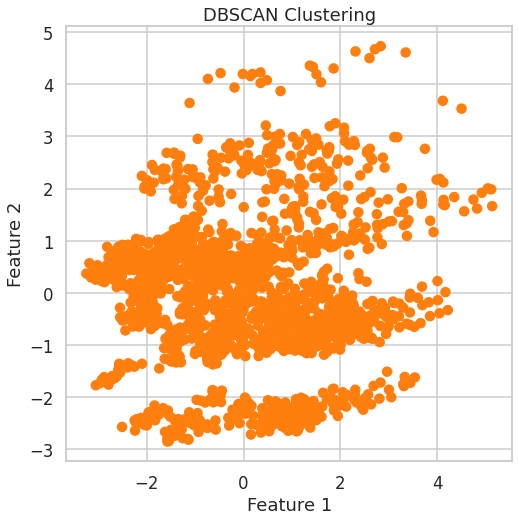

Total number of clusters: 0


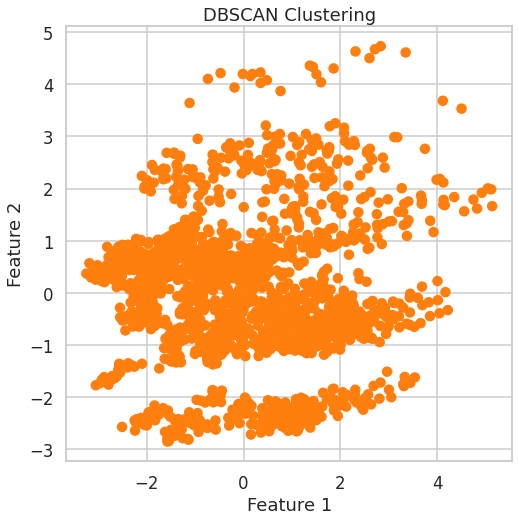

Total number of clusters: 0


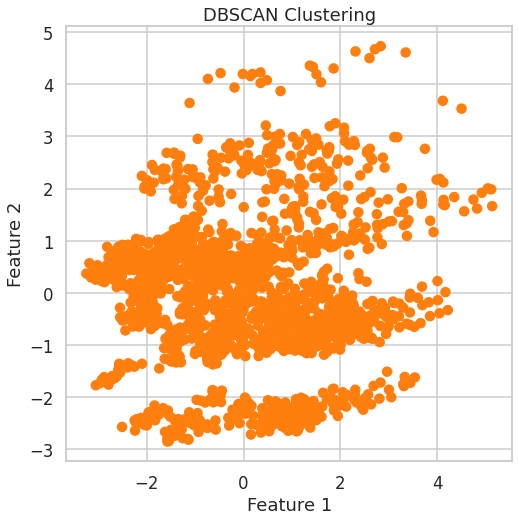

Total number of clusters: 0


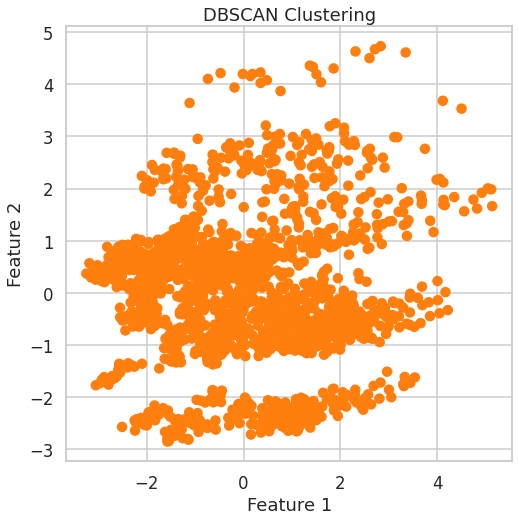

Total number of clusters: 0


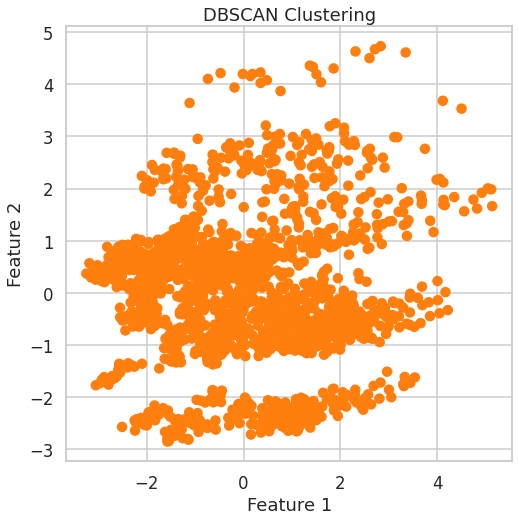

Total number of clusters: 0


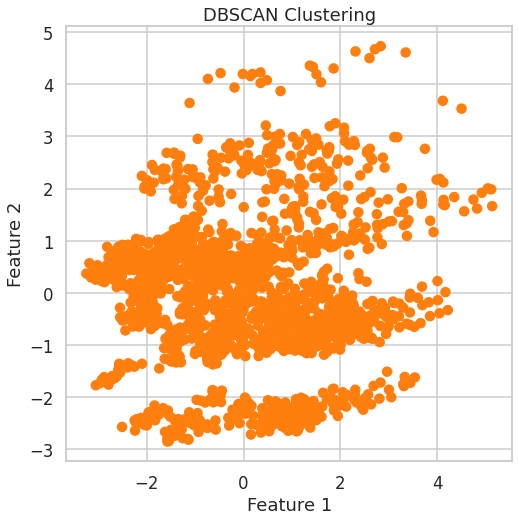

Total number of clusters: 0


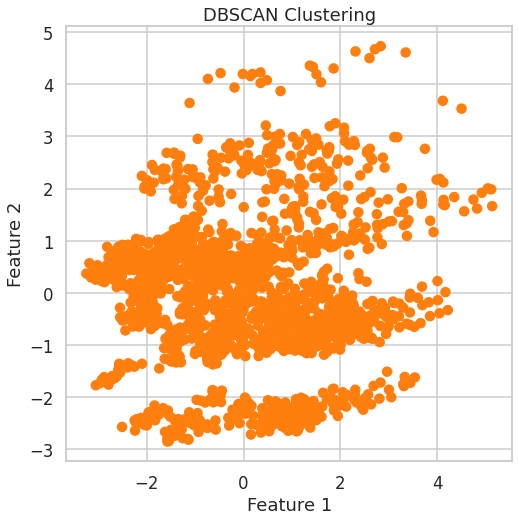

Total number of clusters: 0


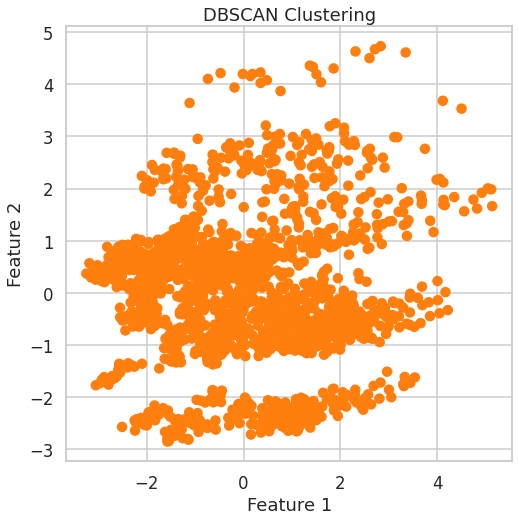

Total number of clusters: 0


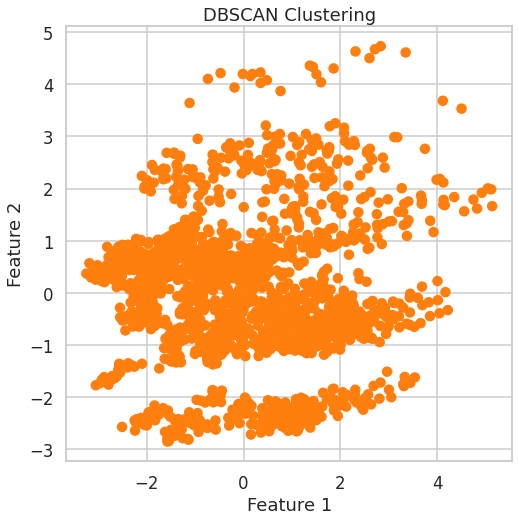

Total number of clusters: 0


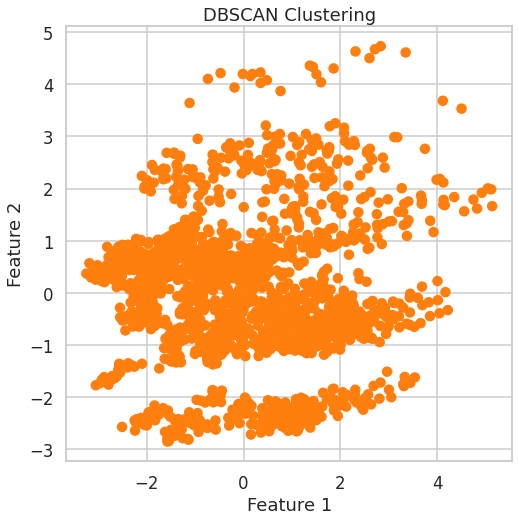

Total number of clusters: 0


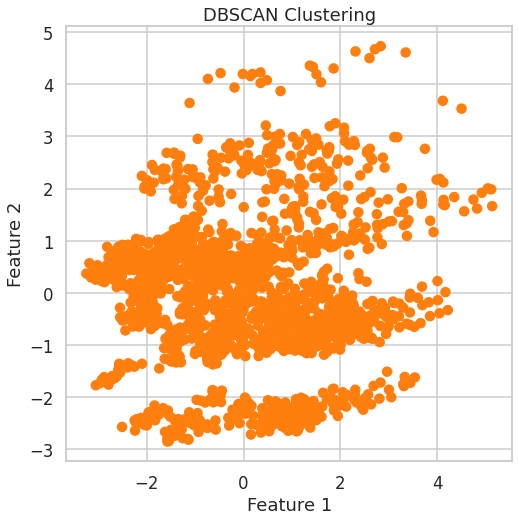

Total number of clusters: 1


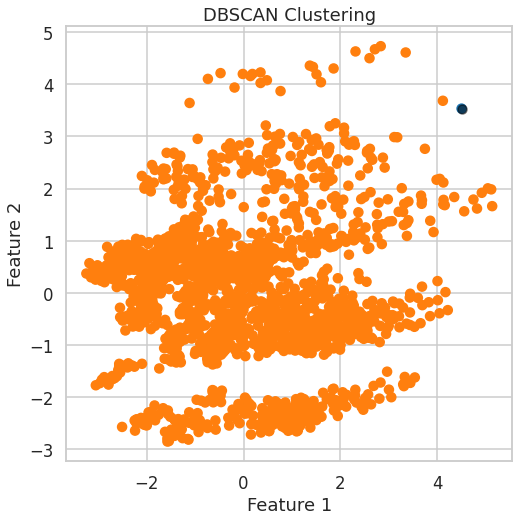

Total number of clusters: 1


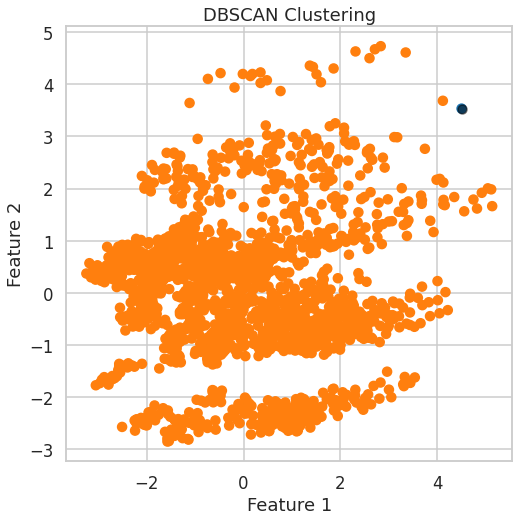

Total number of clusters: 1


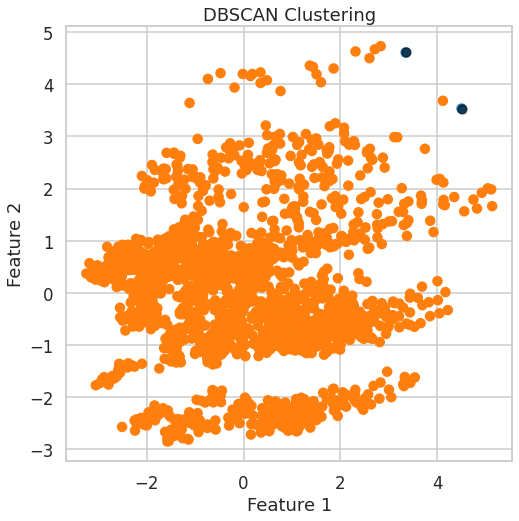

Total number of clusters: 1


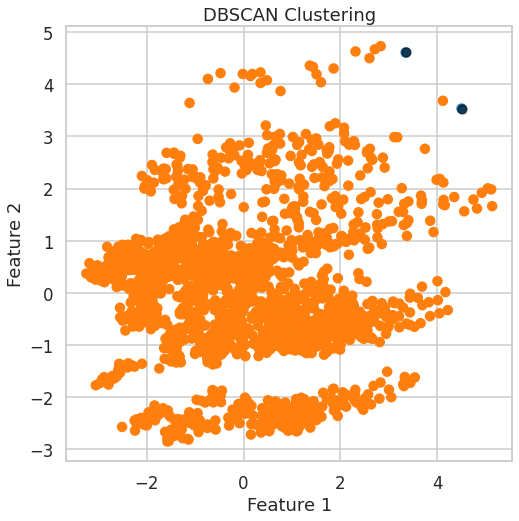

Total number of clusters: 1


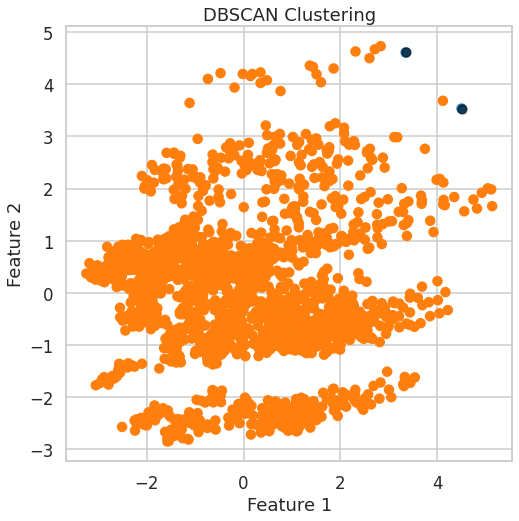

Total number of clusters: 1


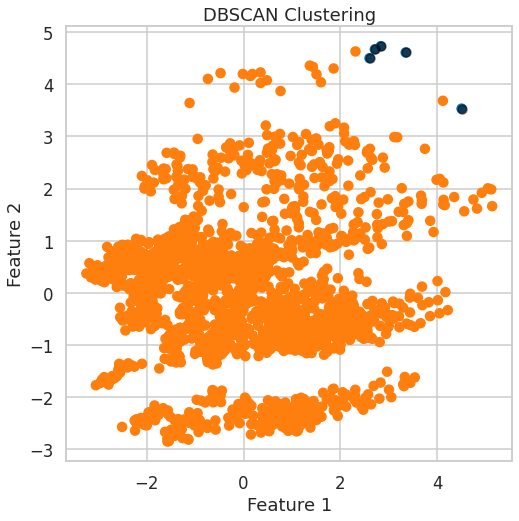

Total number of clusters: 1


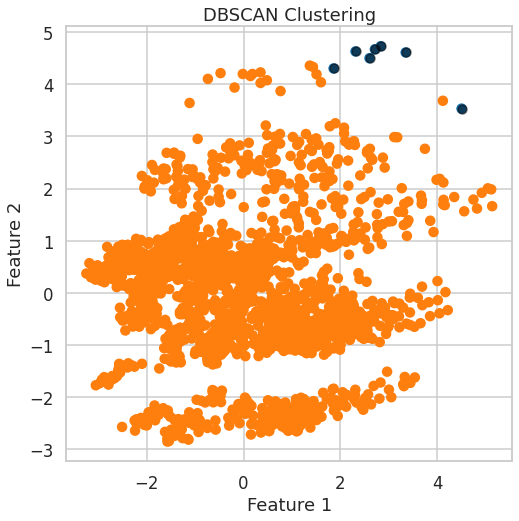

Total number of clusters: 1


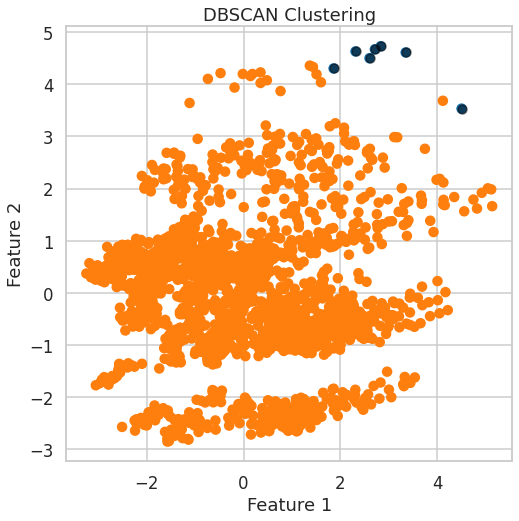

Total number of clusters: 1


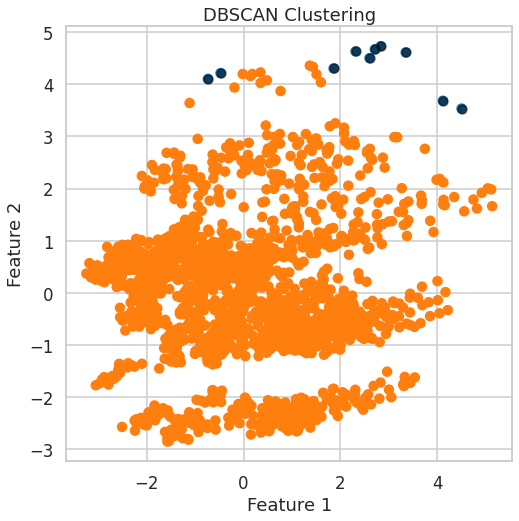

Total number of clusters: 1


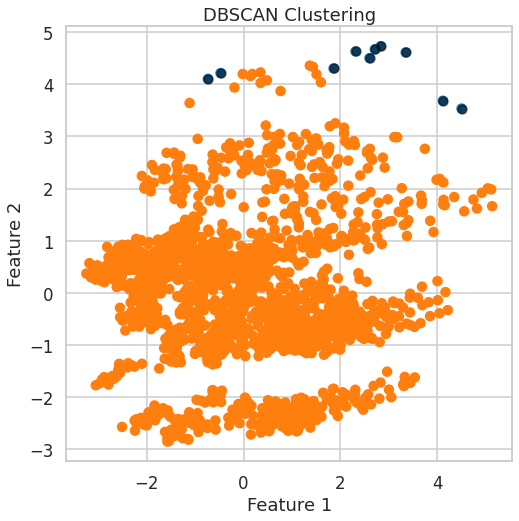

Total number of clusters: 1


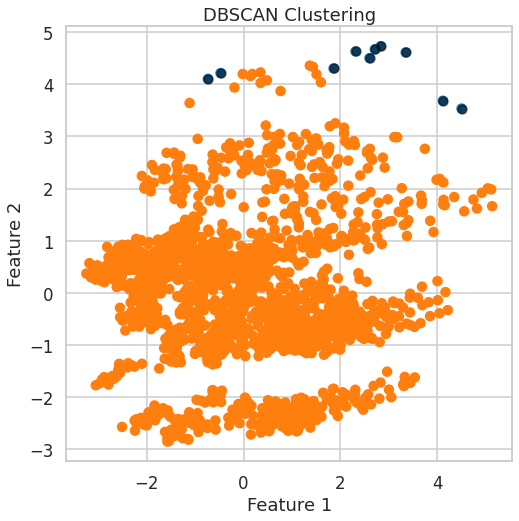

Total number of clusters: 1


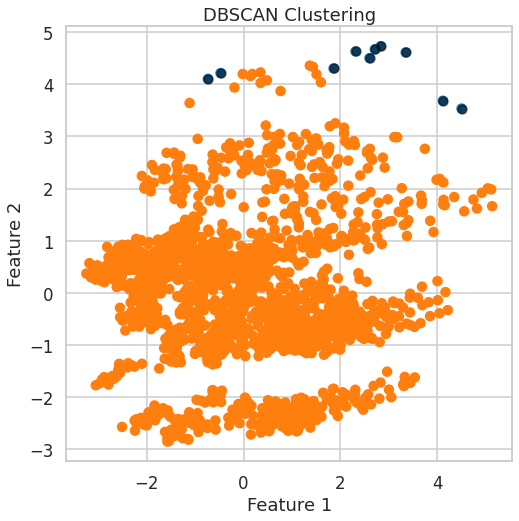

Total number of clusters: 1


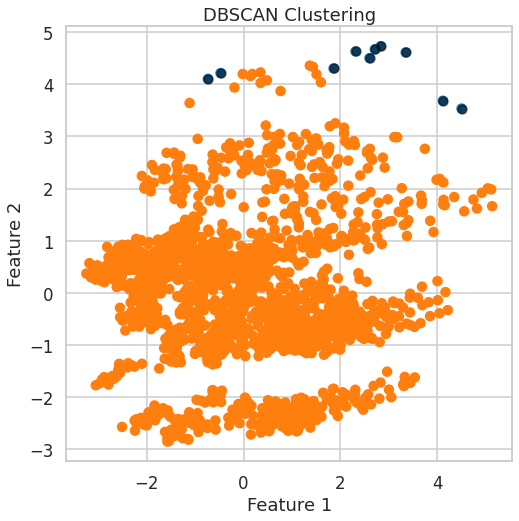

Total number of clusters: 1


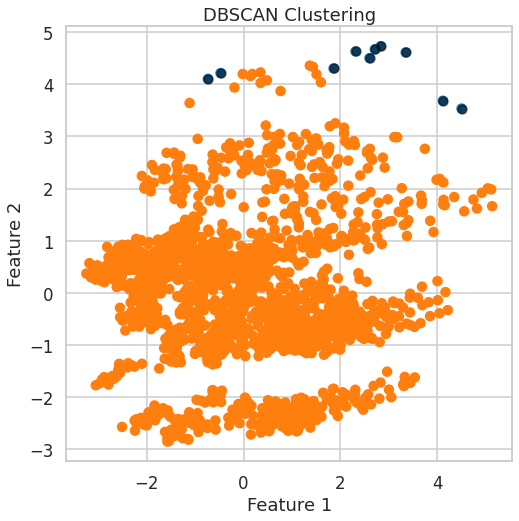

Total number of clusters: 1


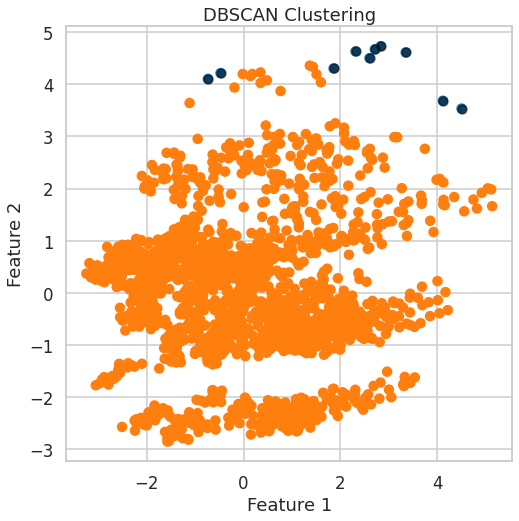

Total number of clusters: 1


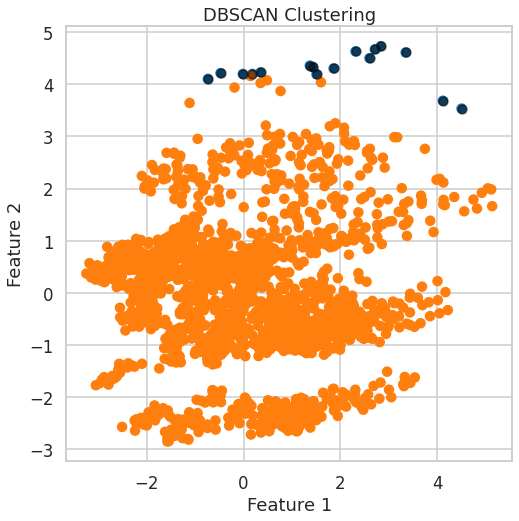

Total number of clusters: 1


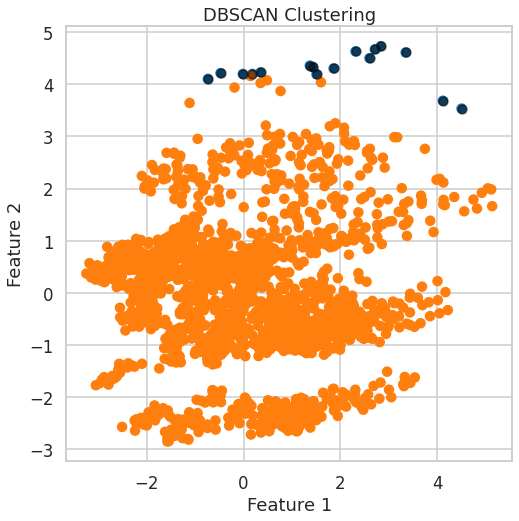

Total number of clusters: 1


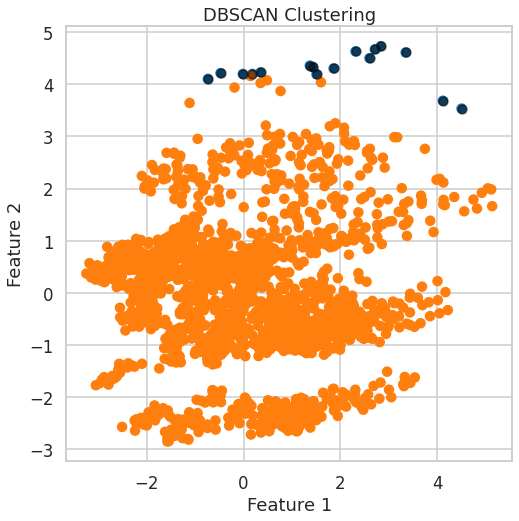

Total number of clusters: 1


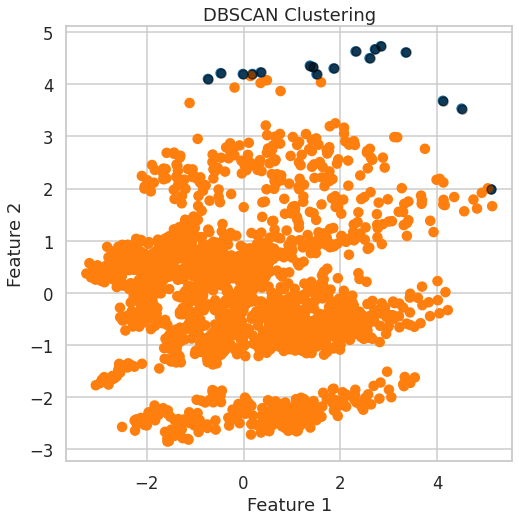

Total number of clusters: 1


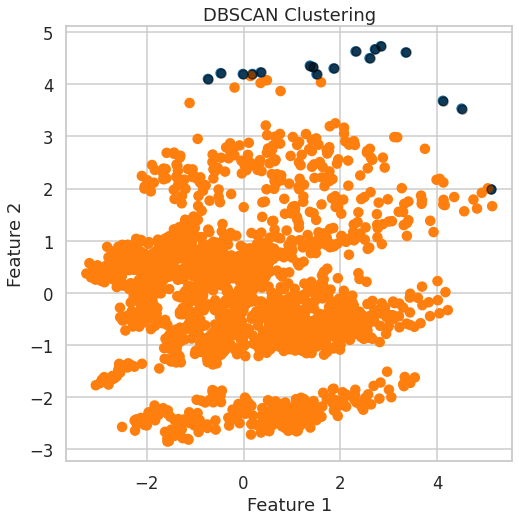

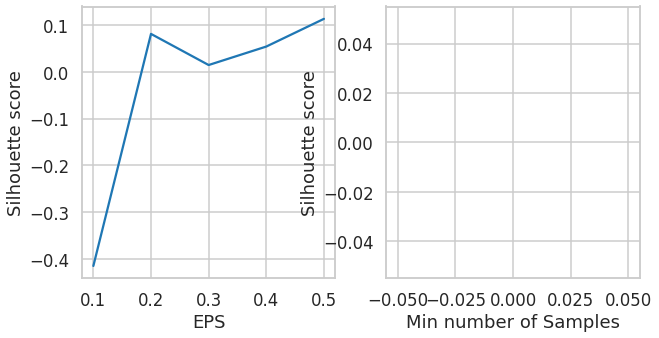

In [85]:
DB_Scanning(reduced_data)

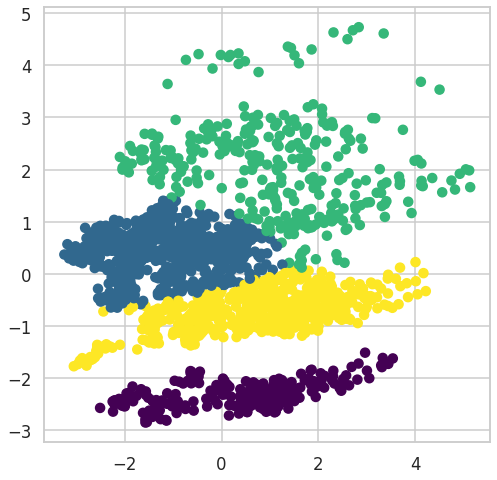

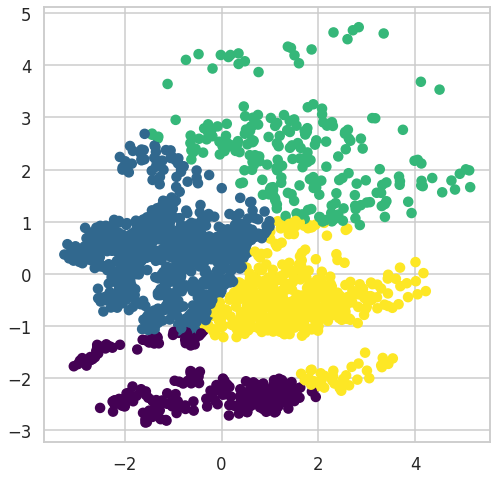

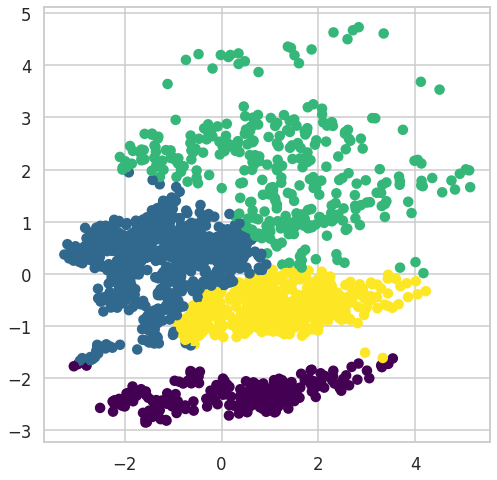

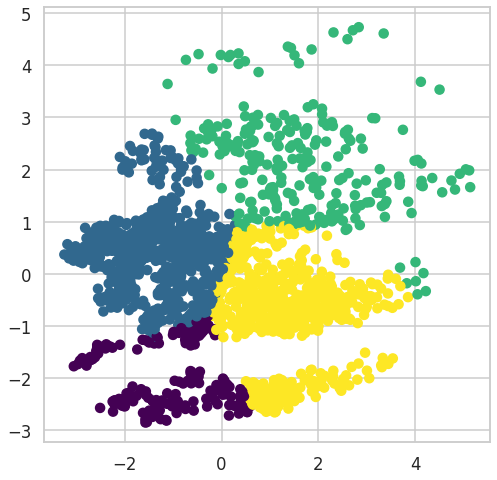

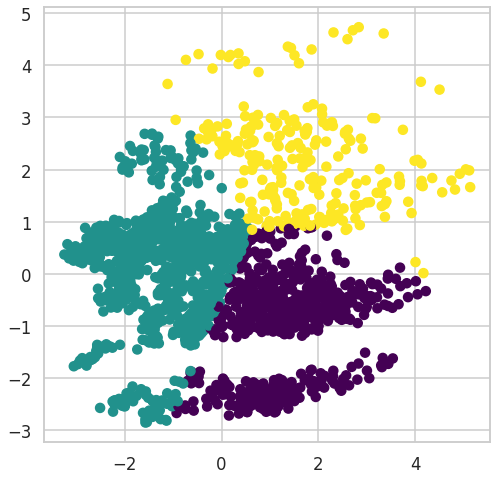

...

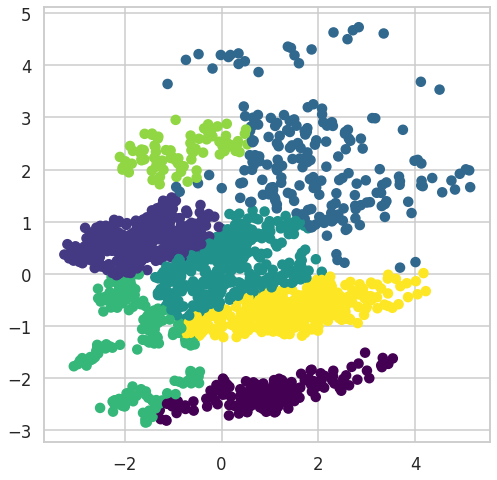

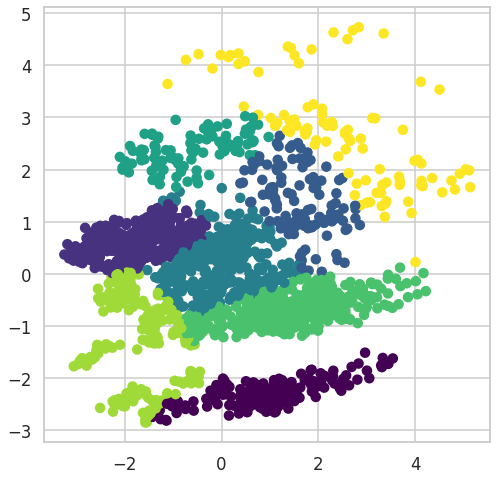

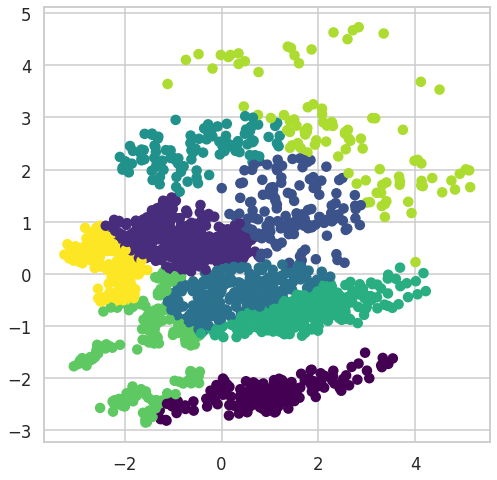

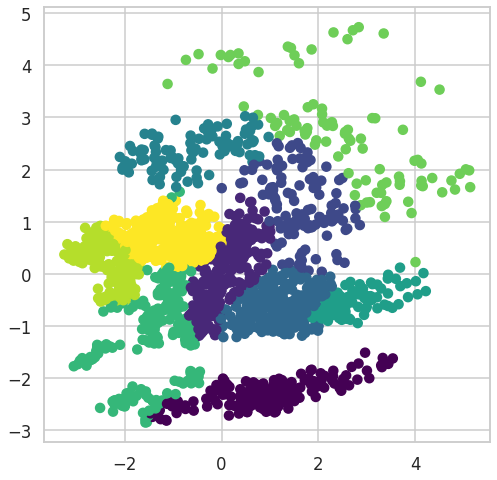

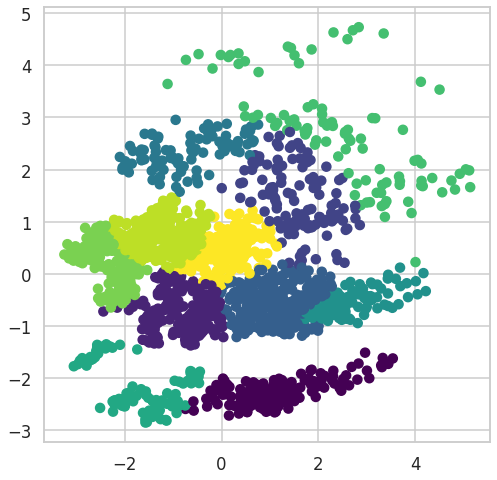

In [87]:
TheGaussian(reduced_data)